In [82]:
# relevant imports
from datetime import datetime
import requests
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
import matplotlib.pyplot as plt
from fa2_modified import ForceAtlas2
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
import community as community_louvain 
from nltk.probability import FreqDist
from collections import defaultdict, Counter
import seaborn as sns
from matplotlib.colors import ListedColormap
import powerlaw
# set style for plots
sns.set(style='whitegrid')
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.dowlnoad('punkt_tab')


## Project Assignment B

Group 31:
- s233576 Beatriz Braga
- s232829 Leonardo Debarba Bassani
- s242962 Mátyás András

# **Analyzing U.S. Presidential Speeches: Sentiments, Topics, and Political Context**

This notebook documents the full process of analyzing U.S. presidential speeches through network analysis and natural language processing. Our analysis revolves around a network of speeches, where each node represents a speech, and edges connect speeches with high similarity based on cosine similarity of their text embeddings. Each node includes several attributes, such as the transcript, president, party, date, etc. By leveraging Natural Language Processing techniques and network analysis, we aim to uncover patterns in presidential rhetoric, examining how themes and sentiments evolve over time. The analysis connects speeches to external factors such as political party affiliations, economic indicators and historical events, shedding light on the relationship between political messaging, economics and social changes.



## Save And Preprocess Speeches Data

We start by retrieving U.S. presidential speeches data using the [Miller Center API](https://data.millercenter.org/api.html). The data is fetched in multiple requests to handle pagination and saved into a JSON file for later use.


In [ ]:
# api call to get all speeches
endpoint = "https://api.millercenter.org/speeches"
r = requests.post(url = endpoint)
data = r.json()
items = data['Items']

# collect all speeches
while 'LastEvaluatedKey' in data:
  parameters = {"LastEvaluatedKey": data['LastEvaluatedKey']['doc_name']}
  r = requests.post(url = endpoint, params = parameters)
  data = r.json()
  items.extend(data.get('Items', []))

# save the collected items to a JSON file
with open('data/speeches.json', 'w') as f:
  json.dump(items, f, indent=4)

In [2]:
# load data from the JSON file
with open('data/speeches.json', 'r') as f:
  speeches = json.load(f)

The speech dates are converted to datetime objects for easier manipulation. Only speeches from 1790 onward are kept, as GDP data starts from that year.

In [3]:
# convert the date strings to datetime objects
for speech in speeches:
    date_str = speech['date'][:10]
    speech['date'] = datetime.strptime(date_str, '%Y-%m-%d')

# consider only speeches after 1790, as we only have gdp data from 1790-2024
speeches = [speech for speech in speeches if speech['date'].year >= 1790]


In [4]:
# initial data statistics
print(f'Number of speeches: {len(speeches)}')
presidents = set(speech['president'] for speech in speeches)
print(f'Number of presidents: {len(presidents)}')
speeches.sort(key=lambda x: x['date'])
print(f'Time span: {speeches[0]["date"].year} - {speeches[-1]["date"].year}')


Number of speeches: 1055
Number of presidents: 45
Time span: 1790 - 2024


In this step, the text of each speech is encoded into embeddings using the SentenceTransformer model. The cosine similarity matrix is then computed to assess the similarity between speeches.

In [5]:
# get text embeddings for each speech
model = SentenceTransformer('all-MiniLM-L6-v2')
embeddings = model.encode([speech['transcript'] for speech in speeches])

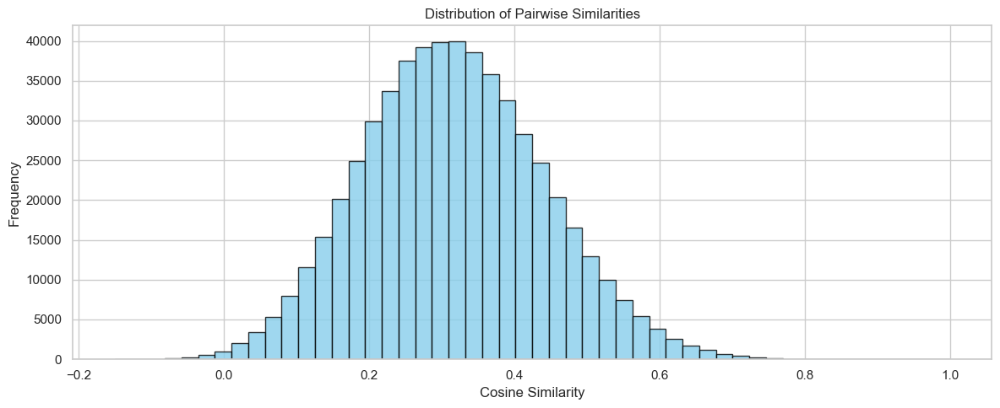

In [106]:
# compute the cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)
# get the upper triangle of the matrix without the diagonal (remove repeated pairs and self-similarity)
upper_triangle = similarity_matrix[np.triu_indices_from(similarity_matrix, k=1)]
# plot bar chart of the distribution of pairwise similarities
hist, bin_edges = np.histogram(upper_triangle.flatten(), bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.figure(figsize=(12, 5))
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.title('Distribution of Pairwise Similarities')
plt.tight_layout()
plt.show()

**Threshold Selection:**
 
A range of thresholds (0.3 to 0.9) is tested to determine the optimal similarity score for creating edges in the network. The metrics of interest include
- Largest Connected Component Size: Number of nodes in the largest connected subgraph.
- Modularity: Evaluates the quality of the network partitioning.
- Average Degree: Average number of edges per node.
- Density: Represents the fraction of actual edges relative to the maximum possible edges.

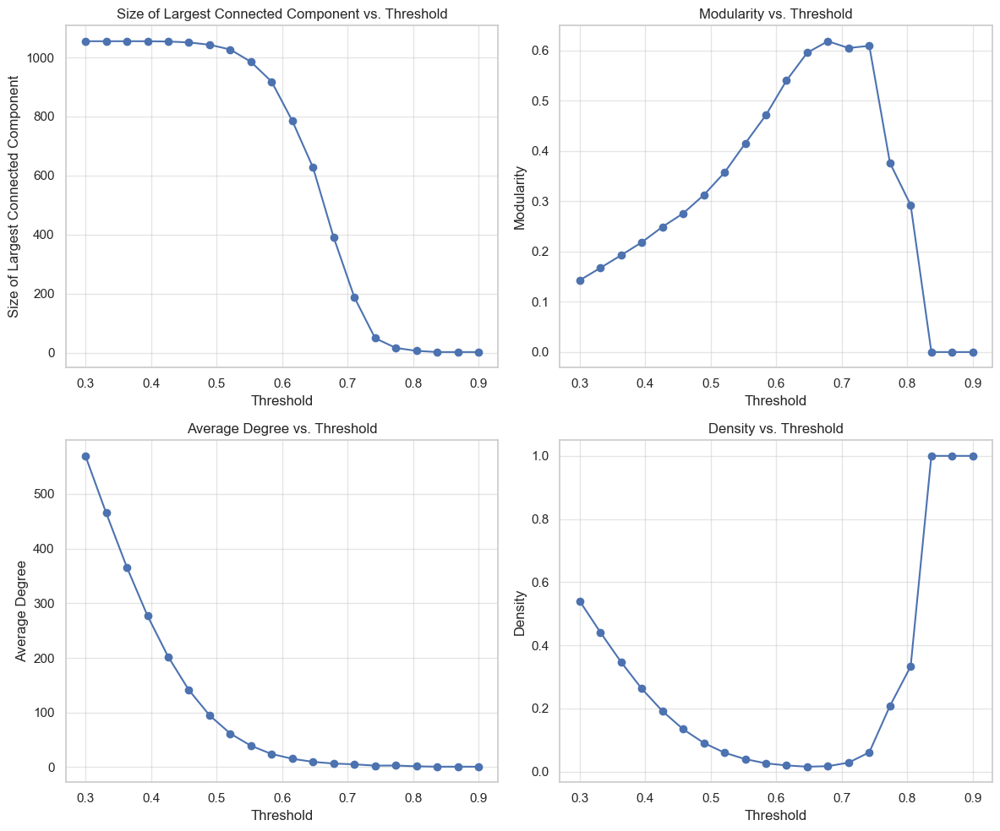

In [84]:
# find optimal threshold of similarity for edge creation 
thresholds = np.linspace(0.3, 0.9, 20)
metrics = {'density': [], 'modularity': [], 'avg_degree': [], 'largest_cc_size': []}
i_indices, j_indices = np.triu_indices_from(similarity_matrix, k=1)
similarity_list = [(i, j, similarity_matrix[i, j]) for i, j in zip(i_indices, j_indices)]

for threshold in thresholds:
    # create graph
    G = nx.Graph()
    G.add_nodes_from(range(len(similarity_matrix)))
    # eges based on similarity
    for i in range(len(speeches)):
        for j in range(i + 1, len(speeches)):
            if similarity_matrix[i][j] > threshold:
                G.add_edge(i, j, weight=similarity_matrix[i][j])
    
    # calculate network metrics
    # largest connected component
    largest_component = max(nx.connected_components(G), key=len)
    largest_cc_size = len(largest_component)
    metrics['largest_cc_size'].append(largest_cc_size)
    largest_cc = G.subgraph(largest_component)
    # remove nodes with degree 0
    G = G.subgraph([node for node in G.nodes() if G.degree(node) > 0])
    # density
    metrics['density'].append(nx.density(largest_cc))
    # average degree
    avg_degree = np.mean([deg for _, deg in largest_cc.degree()])
    metrics['avg_degree'].append(avg_degree)
    # modularity
    modularity = community_louvain.modularity(community_louvain.best_partition(largest_cc), largest_cc)
    metrics['modularity'].append(modularity)

# visualize metrics in different plots
plt.subplots(2, 2, figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.plot(thresholds, metrics['largest_cc_size'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Size of Largest Connected Component')
plt.title('Size of Largest Connected Component vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 2)
plt.plot(thresholds, metrics['modularity'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Modularity')
plt.title('Modularity vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 3)
plt.plot(thresholds, metrics['avg_degree'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Average Degree')
plt.title('Average Degree vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 4)
plt.plot(thresholds, metrics['density'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Density')
plt.title('Density vs. Threshold')
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()


From the plots above, a treshold between 0.6 to 0.65 seems to provide the best balance between high modularity and a sufficiently large largest connected component to preserve network interpretability.
Therefore, **0.625** is chosen as the similarity threshold for edge creation in our network, balancing modularity and connectedness, which should result in distinct communities without significant loss in network size.

## Create Speeches Network

We can now create out U.S. presidential speeches network, where each node represents a speech and weighted edges are formed between speeches that share a cosine similarity greater than 0.625.
Each node includes initially the speech title, president, date and transcript as attributes.

In [8]:
# create a graph where nodes are speeches and edges are similarities
SpeechNet = nx.Graph()

# ddd nodes with attributes (each node is a speech)
for i, speech in enumerate(speeches):
    SpeechNet.add_node(i, title=speech['title'], president=speech['president'], date=speech['date'], transcript=speech['transcript'])

# ddd edges between speeches with similarity greater than 0.625
threshold = 0.625
for i in range(len(speeches)):
    for j in range(i + 1, len(speeches)):
        if similarity_matrix[i][j] > threshold:
            # add edge with weight equal to similarity
            SpeechNet.add_edge(i, j, weight=similarity_matrix[i][j])

The network is reduced to the largest connected component to focus on the most significant part of the network and nodes with no connections are removed.

In [9]:
# consider only the largest connected component
largest_cc = max(nx.connected_components(SpeechNet), key=len)
SpeechNet = SpeechNet.subgraph(largest_cc)

In [10]:
# remove isolated nodes
SpeechNet = SpeechNet.subgraph([node for node in SpeechNet.nodes() if SpeechNet.degree(node) > 0])

In [11]:
# print node and edge counts
print(f'Numer of Nodes: {SpeechNet.number_of_nodes()}')
print(f'Number of Edges: {SpeechNet.number_of_edges()}')

Numer of Nodes: 743
Number of Edges: 5041


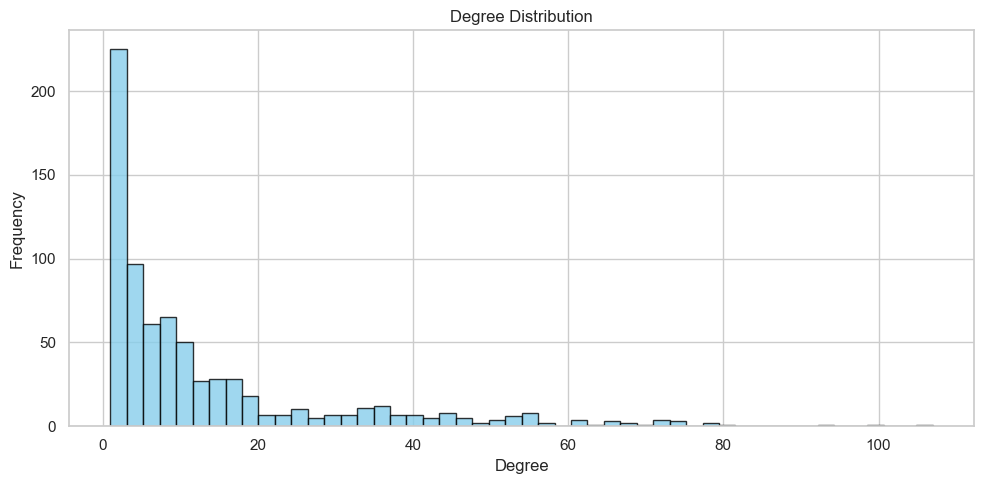

In [85]:
# plot degree distribution
degrees = [degree for node, degree in SpeechNet.degree()]
hist, bin_edges = np.histogram(degrees, bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.figure(figsize=(10, 5))
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.tight_layout()
plt.show()


The degree distribution plot of the network shows that most nodes have low degrees, while a few nodes are highly connected. This pattern suggests the presence of hubs, indicating that the network could exhibit characteristics of a scale-free network. The long tail in the distribution, with few nodes having high degrees, is typical of a power-law distribution commonly found in real-world networks. Scale-free networks typically present a few central hubs that are highly connected, whilw the majority of nodes have few connections. However, after fitting the degree distribution to a power-law model and performing a Log-Likelihood Ratio Test against an exponential distribution, the p-value was 0.465, which is considerably high. This suggests that the difference between the two distributions is not significant, i.e. the network's degree distribution does not strongly follow a power law, or it might be closer to a random exponential-like distribution.

In [13]:
fit = powerlaw.Fit(degrees)
R, p = fit.distribution_compare('power_law', 'exponential')
print(f"Log-Likelihood Ratio Test p-value: {p}")


Calculating best minimal value for power law fit
Log-Likelihood Ratio Test p-value: 0.465784703772242


## Community Analysis

**Modularity** measures the strength of community structure in a network by comparing the density of links within communities to what would be expected in a random network. The score ranges from -1 to 1, where higher values indicate stronger community structures, and values close to zero or negative suggest weak or no structure. This helps identifying groups with more connections within themselves than to other groups.

In [262]:
# position nodes using Force Atlas 2
forceatlas2 = ForceAtlas2(verbose=False, scalingRatio=0.2)
positions = forceatlas2.forceatlas2_networkx_layout(SpeechNet, pos=None, iterations=2000)

**Partition of the network into parties:**

Characterize each node's party as the delivering president's party.

In [20]:
from data.parties import president_party, party_colors
node_colors = []

for node in SpeechNet.nodes():
    president = SpeechNet.nodes[node]['president']
    party = president_party.get(president, "None")
    # add party attribute to nodes  
    SpeechNet.nodes[node]['party'] = party
    # add color to nodes based on party
    color = party_colors.get(party, "gray") 
    node_colors.append(color)

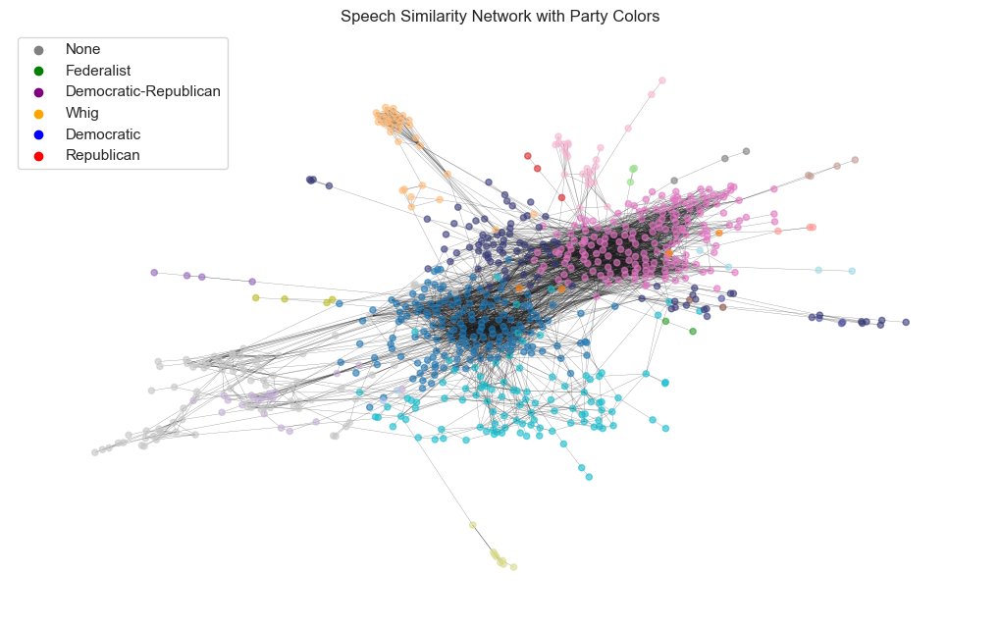

In [365]:
# plot the network with party colors
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for party, color in party_colors.items():
    plt.scatter([], [], c=color, label=party)
plt.legend(scatterpoints=1, loc='best')
plt.title('Speech Similarity Network with Party Colors')
plt.show()

In [21]:
# create a dictionary to map parties to their respective nodes
parties_dict = {}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    if party not in parties_dict:
        parties_dict[party] = []
    parties_dict[party].append(node)

# calculate modularity for parties communities
modularity = 0.0
L = SpeechNet.number_of_edges()  # number of edges in the network
for genre, nodes in parties_dict.items():
    genre_subgraph = SpeechNet.subgraph(nodes)
    L_c = genre_subgraph.number_of_edges()  # number of edges within the genre community
    K_c = sum(dict(SpeechNet.degree(nodes)).values())  # sum of degrees of nodes within the genre community
    modularity += (L_c / L) - ((K_c / (2 * L)) ** 2)
print(f'Modularity considering parties: {modularity}')

Modularity considering parties: 0.07699803488010101


The network's modularity when considering the party affiliations of the presidents, suggests a weak community structure based on parties. This indicates that party affiliation might not be the strongest factor in clustering similar speeches, i.e., presidents from the same party do not tend to have speeches that are more similar to each other than to those from presidents of different parties.

This is further evidenced by the network plot, where the mixture of colors representing different parties shows that speeches from presidents of the same party are not clearly grouped together. The blended representation of colors indicates that party affiliation does not strongly influence the clustering of similar speeches.

Finding communities using [the Python Louvain-algorithm implementation](http://perso.crans.org/aynaud/communities/):

In [14]:
# calculate modularity for louvain communities
louvain_partition = community_louvain.best_partition(SpeechNet, random_state=41) 
nx.set_node_attributes(SpeechNet, louvain_partition, 'louvain_community')

In [15]:
# create a dictionary to map louvain communities to their respective nodes
louvain_dict = defaultdict(list)
for node, community in louvain_partition.items():
    louvain_dict[community].append(node)

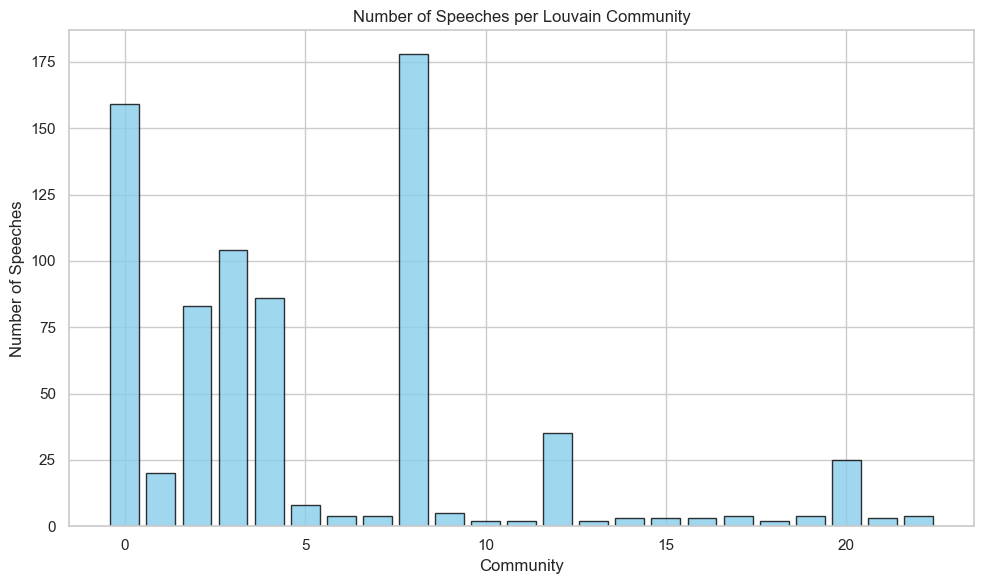

In [86]:
# plot number of speeches per community
community_sizes = [len(nodes) for nodes in louvain_dict.values()]
plt.figure(figsize=(10,6))
plt.bar(range(len(community_sizes)), community_sizes, color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Community')
plt.ylabel('Number of Speeches')
plt.title('Number of Speeches per Louvain Community')
plt.tight_layout()
plt.show()

From the distribution of speeches per community, it is clear that some communities are significantly larger than the majority. This pattern is also visible in the network visualization plot that follows, where dense clusters correspond to these larger communities.

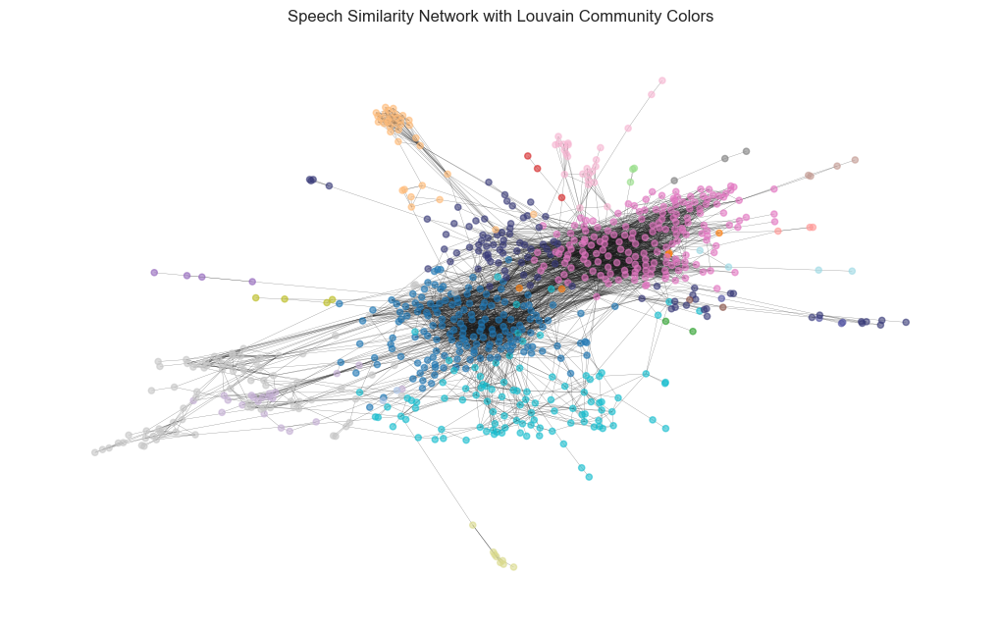

In [361]:
# get colors for louvain communities
louvain_colors = [louvain_partition[node] for node in SpeechNet.nodes()]
colors1 = plt.cm.get_cmap('tab20', 20)
colors2 = plt.cm.get_cmap('tab20b', len(set(louvain_dict.keys())))
combined_colors = np.vstack((colors1(np.linspace(0, 1, colors1.N)), colors2(np.linspace(0, 1, colors2.N))))
colors = ListedColormap(combined_colors)
louvain_colors = {community: colors(i) for i, community in enumerate(set(louvain_dict.keys()))}
# assign colors to nodes
node_colors = [louvain_colors[louvain_partition[node]] for node in SpeechNet.nodes()]
# plot the network with louvain community colors
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for community, color in louvain_colors.items():
    plt.scatter([], [], color=color, label=community)
plt.title('Speech Similarity Network with Louvain Community Colors')
plt.show()

In [270]:
louvain_modularity = community_louvain.modularity(louvain_partition, SpeechNet)
print(f"Louvain modularity: {louvain_modularity}")

Louvain modularity: 0.5495970837354964


The modularity of the partitioning of the speech network obtained using the Louvain algorithm is considerably higher than the one obtained based on the parties. This suggests that the algorithm was able to find stronger community structures in the network, indicating that there are additional patterns in the data beyond party affiliation. The relationships within the network can be influenced by different factors such as speech content, political context, etc.

The network visualization with nodes colored according to their Louvain communities further reinforces this insight. We can clearly notice clusters of nodes, representing groups of speeches that are more tightly connected within their communities. The distinct separation between these communities, along with the higher modularity score, shows that the Louvain method has identified more meaningful groupings compared to party affiliation.

Let's compare the communities found by the Louvain-algorithm with the political party affiliations by creating a matrix confusion matrix $D$ with dimension ($G \times C$), where G is the parties and C is the 6 most common communities. 
We set entry $D(i,j)$ to be the number of nodes that genre $i$ has in common with community $j$. 

Calculate G

In [22]:
G = parties_dict.keys()

Calculate C

In [23]:
# top 6 most common communities ordered by the number of speeches in the community of louvain partition

community_count = {key: len(value) for key, value in louvain_dict.items()}
top6_communities = dict(sorted(community_count.items(), key=lambda x: x[1], reverse=True)[:6])

C = top6_communities.keys()

Calculate matrix D

In [24]:
# create matrix of party-community intersections
D = pd.DataFrame(0, index=G, columns=C)
for party in G:
    for community in C:
        D.loc[party, community] = len(set(parties_dict[party]).intersection(louvain_dict[community]))
print('Confusion matrix D:')
print(D)

Confusion matrix D:
                       12  0   18  20  15  3 
None                    7  10   4   2   5   8
Federalist              0   3   0   0   1   0
Democratic-Republican   0  37   4   1   7   0
Democratic             83  51  49  42  40  23
Whig                    0   9   7   0   7   0
Republican             88  49  40  41  23   4


The confusion matrix reveals that the Louvain communities do not align with political party affiliations. While some parties, like the Democratic and Republican parties, show strong overlaps with certain communities (e.g., community 12), there is notable mixing between parties in several communities. This suggests that speech content similarity transcends party lines, indicating that factors beyond party affiliation influenced the speech louvain algorithm partition. The relatively low overlap for smaller parties, like the Federalist and Whig, further emphasizes the complexity of speech patterns in the dataset.

## Sentiment Analysis

Sentiment analysis is an important tool in understanding the sentiment behind a piece of text. In the context of our network, analyzing the sentiment of presidential speeches can provide valuable insights into how the tone and emotions in these speeches relate to various factors, such as political strategies, public perceptions, or societal issues at the time. This can be useful for examining trends in sentiment over time, comparing sentiments across different political parties, or analyzing the relationship between sentiment and the community structure discovered earlier.

In our project we use the  LabMT dataset from [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) (Data Set S1) to calculate sentiment scores based on the happiness ratings of words, which reflect the emotional tone typically associated with those words. 

It is important to note that this sentiment analysis relies on the predefined wordlist and reflects only the surface sentiment of the words used in the speeches. This method does not fully capture the audience's emotional reactions or the complete context and nuance of the speeches.

In [ ]:
# download sentiment wordlist 
with open('data/Data_Set_S1.txt', 'r') as f:
    data_S1 = f.read()

data_S1 = [line.split('\t') for line in data_S1.strip().split('\n')]
data_S1 = data_S1[3:]
data_S1 = pd.DataFrame(data_S1[1:], columns = data_S1[0])

Function to process text in the speech transcrits (tokenization, removing ponctuation, setting to lower case, removing stopwords, lemmatizing).

In [25]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def process_text(text):
    """
    Process the text by tokenizing, removing punctuation, setting to lowercase, removing stopwords, and lemmatizing.
    """
    # tokenize text
    words = word_tokenize(text)
    # remove punctuation
    words = [word for word in words if word.isalpha()]
    # set to lowercase
    words = [word.lower() for word in words]
    # remove stopwords
    words = [word for word in words if word not in stop_words]
    # lemmatize words
    words = [lemmatizer.lemmatize(word) for word in words]
    return words   



Function to calculate the sentiment score of a certain text based on the average hapiness score of each words in the LabMT wordlist

In [26]:
def sentiment_score(text):
    """
    Calculate the sentiment score of the text based on the sentiment wordlist.
    """
    # process text to get words
    words = process_text(text)
    freq_dist = FreqDist(words)
    # calculate sentiment score
    score = sum(freq_dist[word] *float(data_S1[data_S1['word']==word]['happiness_average'].values[0]) 
                for word in freq_dist if word in data_S1['word'].values)

    total_frequency = sum(freq_dist[word] for word in freq_dist if word in data_S1['word'].values)
    if total_frequency > 0:  # to avoid division by zero
        return score / total_frequency
    else:
        return 0.0

Calculate and save the sentiment for each speech.

In [ ]:
# calculate sentiment for every node's transcript
sentiments = {}
for node, data in SpeechNet.nodes(data=True):
    speech = node
    transcript = data['transcript']
    sentiments[speech] = sentiment_score(transcript)

# save the sentiment scores to a file
with open('data/sentiments.txt', 'w') as f:
    for speech, sentiment in sentiments.items():
        f.write(f"{speech} | {sentiment}\n")

Assign scores to nodes as attributes.

In [27]:
# read sentiment scores from file
sentiments = {}
with open('data/sentiments.txt', 'r') as f:
    for line in f:
        speech, sentiment = line.strip().split(' | ')
        speech = int(speech)
        sentiments[speech] = float(sentiment)
 
# assign sentiment scores to nodes as an attribute
nx.set_node_attributes(SpeechNet, sentiments, 'sentiment')

In [28]:
# average sentiment
average_sentiment = sum(sentiments.values()) / len(sentiments)
print(f"Average sentiment of the speeches: {average_sentiment}")

# median sentiment
median_sentiment = np.median(list(sentiments.values()))
print(f"Median sentiment of the speeches: {median_sentiment}")

# variance of sentiment
variance_sentiment = np.var(list(sentiments.values()))
print(f"Variance of sentiment of the speeches: {variance_sentiment}")

# 25th percentile of sentiment
percentile_25 = np.percentile(list(sentiments.values()), 25)
print(f"25th percentile of sentiment of the speeches: {percentile_25}")

# 75th percentile of sentiment
percentile_75 = np.percentile(list(sentiments.values()), 75)
print(f"75th percentile of sentiment of the speeches: {percentile_75}")

Average sentiment of the speeches: 5.638436693821281
Median sentiment of the speeches: 5.6295686619718275
Variance of sentiment of the speeches: 0.019115696090402423
25th percentile of sentiment of the speeches: 5.55791905855339
75th percentile of sentiment of the speeches: 5.715860427716681


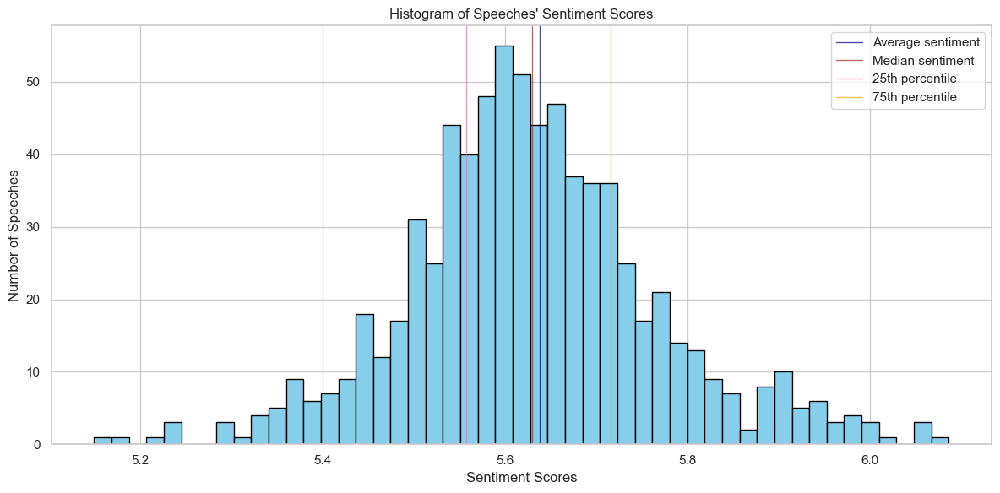

In [87]:
# plot of sentiment distribution of speeches

# create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)  

# count the number of artists in each bin
binned_counts, bin_edges = np.histogram(list(sentiments.values()), bins=v)

# bar plot for the histogram
plt.figure(figsize=(12, 6))
plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), color='skyblue', edgecolor='black')
# average sentiment line
plt.axvline(average_sentiment, color='navy', linestyle='-', linewidth=1, alpha=0.7)
# median sentiment line
plt.axvline(median_sentiment, color='brown', linestyle='-', linewidth=1, alpha=0.7)
# 25th percentile line
plt.axvline(percentile_25, color='hotpink', linestyle='-', linewidth=1, alpha=0.7)
# 75th percentile line
plt.axvline(percentile_75, color='orange', linestyle='-', linewidth=1, alpha=0.7)
plt.legend(['Average sentiment', 'Median sentiment', '25th percentile', '75th percentile'])
plt.title('Histogram of Speeches\' Sentiment Scores')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()


The histogram of sentiment scores reflects a near-normal distribution centered around a positive sentiment range, with scores between 5.1 and 6.1. The distribution is slightly right-skewed, suggesting that there are a few speeches with higher sentiment scores compared to the majority. The average sentiment score shows that most speeches exhibit a moderately positive tone. The average sentiment score is closely aligned with the median sentiment, confirming that most speeches tend to have a positive but not extreme tone. The 25th and 75th percentiles show that the interquartile range is narrow, meaning the majority of sentiment scores are clustered within a similar range.The lower tail of the histogram has minimal counts, suggesting that speeches with significantly lower sentiment scores are rare. Overall, there is a tendency toward higher sentiment scores, as reflected by the slightly larger number of speeches in the higher end of the sentiment spectrum.

**TF-IDF analysis:**

In [30]:
# create tf lists for each speech's transcript
tf_speech = {}
for speech, data in SpeechNet.nodes(data=True):
    text = data['transcript']
    words = process_text(text)
    tf_speech[speech] = pd.Series(words).value_counts()

In [31]:
# calculate document frequency for each word
doc_freq = defaultdict(int)
for tf in tf_speech.values():
    for word in tf.index:
        doc_freq[word] += 1

# calculate IDF for each word
idf_speech = {word: np.log(len(tf_speech) / df) for word, df in doc_freq.items()}

In [32]:
# calculate TF-IDF for each speech
tfidf_speech = {}
for speech, tf in tf_speech.items():
    tfidf_speech[speech] = {word: tf[word] * idf_speech[word] for word in tf.index}

Representation of the 10 happiest speeches.

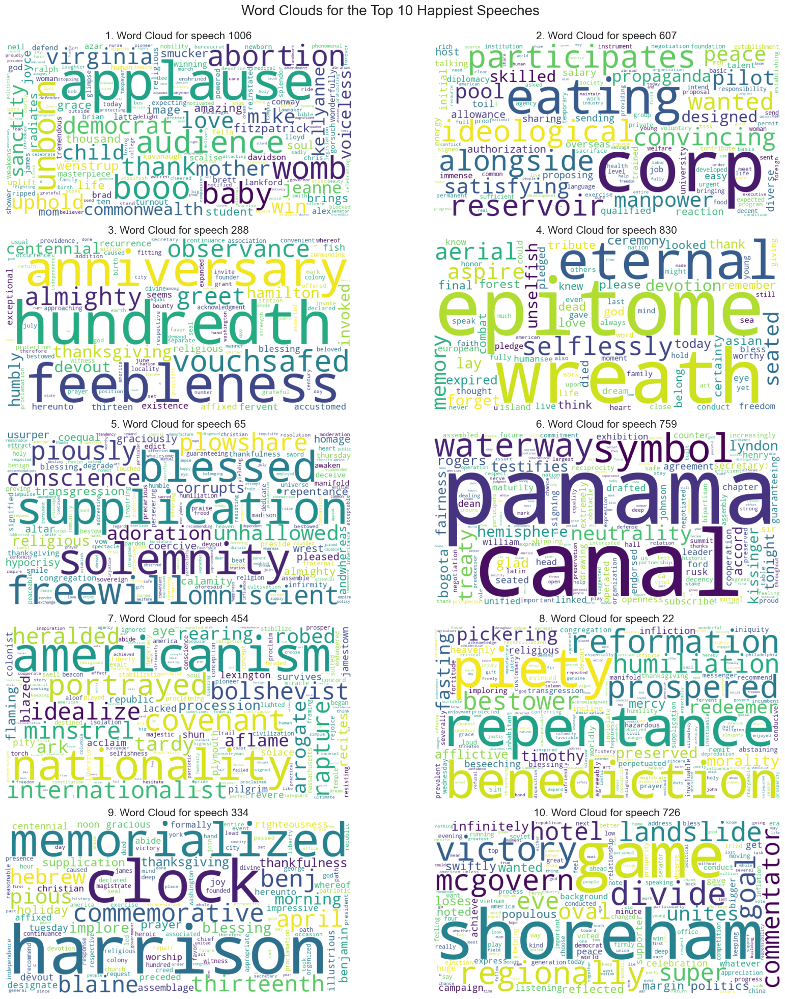

In [88]:
# get the top 10 happiest speeches
happiest_speeches = sorted(sentiments, key=sentiments.get, reverse=True)[:10]

# filter the tfidf_speech dictionary to include only the top 10 happiest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in happiest_speeches}

# create word clouds for the top 10 happiest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
fig.suptitle('Word Clouds for the Top 10 Happiest Speeches \n', fontsize=20)
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"{i+1}. Word Cloud for speech {speech}", fontsize=15)
plt.subplots_adjust(left=0.05, right=0.95, top=0.8, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [43]:
# print "legend" of 10 happiest speeches
for i, speech in enumerate(happiest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 1006
January 24, 2020: Speech at March for Life by Donald Trump.
2. Speech 607
March 1, 1961: Establishment of the Peace Corps by John F. Kennedy.
3. Speech 288
June 26, 1876: Proclamation Celebrating the Hundredth Anniversary of Independence by Ulysses S. Grant.
4. Speech 830
November 11, 1988: Remarks at the Veteran's Day Ceremony by Ronald Reagan.
5. Speech 65
July 23, 1813: Proclamation on Day of Public Humiliation and Prayer by James Madison.
6. Speech 759
September 7, 1977: Statement on the Panama Canal Treaty Signing by Jimmy Carter.
7. Speech 454
January 20, 1920: Americanism by Warren G. Harding.
8. Speech 22
March 23, 1798: Proclamation of Day of Fasting, Humiliation and Prayer by John Adams.
9. Speech 334
April 4, 1889: Commemoration of the Centennial of Washington’s Inauguration by Benjamin Harrison.
10. Speech 726
November 7, 1972: Remarks on Being Reelected to the Presidency by Richard M. Nixon.


From the word clouds and titles of the 10 happiest speeches, we can observe recurring themes related to patriotism, unity and progress.

Many of the speeches emphasize themes of national pride and unity, such as *Americanism*, *nationality*, *thanksgiving* and *anniversary* both on the wordclouds and titles. For instance Speech 288 by Ulysses S. Grant in 1876, commemorating the *Hundredth Anniversary of Independence*, and Speech 454 by Warren G. Harding in 1920 on *Americanism* express a strong sense of national identity and forward-looking optimism. This optimism can also be observed in the other speeches, where words like *satisfying* and *idealize* are present, indicating that these speeches may reflect optimistic views about the nation's future or the potential for growth. Additionally, there is a focus on themes of remembrance, sacrifice and devotion, such as in *epitome*, *eternal* and *wreath* seen in Speech 830 by Ronald Reagan in 1988, honoring veterans. 

Religious themes also feature prominently in speeches like Speech 65 by James Madison in 1813, where words like *supplication*, *solemnity* and *adoration* reflect national reflection and prayer. Speech 22 by John Adams in 1798, focused on *fasting* and *repentance*, further underscores the importance of humility and reflection in the context of national and spiritual growth.

Speech 1006, delivered by Donald Trump on January 24, 2020, at the *March for Life*, highlights controversial topics such as *abortion*, *unborn* and *baby*, with words like *applause* and *thank* showing the emotional support at the event.


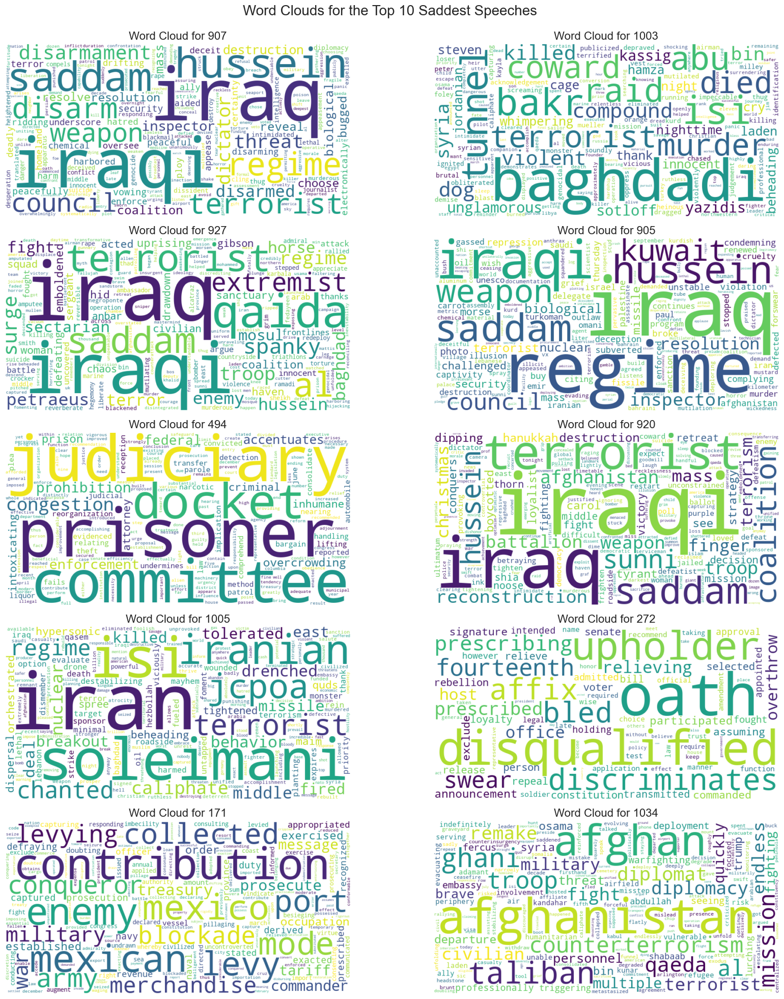

In [89]:
# get the top 10 saddest speeches
saddest_speeches = sorted(sentiments, key=sentiments.get, reverse=False)[:10]

# filter the tfidf_speech dictionary to include only the top 10 saddest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in saddest_speeches}

# create word clouds for the top 10 saddest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
fig.suptitle('Word Clouds for the Top 10 Saddest Speeches \n', fontsize=20)
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for {speech}", fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.8, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [47]:
# print "legend" of 10 saddest speeches
for i, speech in enumerate(saddest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 907
March 17, 2003: Address to the Nation on Iraq by George W. Bush.
2. Speech 1003
October 27, 2019: Statement on the the Death of Abu Bakr al-Baghdadi by Donald Trump.
3. Speech 927
March 19, 2008: Remarks on the War on Terror by George W. Bush.
4. Speech 905
September 12, 2002: Remarks at the UN General Assembly by George W. Bush.
5. Speech 494
April 28, 1930: Message Regarding Law Enforcement by Herbert Hoover.
6. Speech 920
December 19, 2005: Address on Renewal in Iraq by George W. Bush.
7. Speech 1005
January 8, 2020: Statement on Iran by Donald Trump.
8. Speech 272
February 15, 1871: Veto Message Regarding Restrictions on Rebellion Participants by Ulysses S. Grant.
9. Speech 171
January 2, 1849: Message Regarding War-time Measures by James K. Polk.
10. Speech 1034
August 16, 2021: Remarks on Situation in Afghanistan by Joe Biden.


From the analysis of the top 10 saddest speeches based on sentiment, we can identify the somber tone of their topics. The recurring keywords often relate to war, conflict, and national security, drawing attention to various national and global crises and their gravity and distress.

Words like *iraq*, *hussein*, *saddam* and *regime* present on Speech 907 by George W. Bush, delivered on March 17, 2003, about the *Iraq War*, and *baghdadi*, *terrorist* and *raid* on Speech 1003, given by Donald Trump on October 27, 2019, about the *death of Abu Bakr al-Baghdadi*, underscore the gravity and somberness of military conflicts and operations. Speech 927 by George W. Bush in 2008 features words like *qaida*, *extremist* and *surge*, marking the ongoing struggles in *Iraq and the War on Terror*, while Speech 1034 by Joe Biden, contains terms like *afghanistan*, *taliban* and *counterterrorism*, underscoring the tragic realities of the *situation in Afeghanistan* and international relations.

Religious and humanitarian references appear in speeches like **Speech 272** by Ulysses S. Grant in 1871, which mentions words like *oath*, *disqualified* and *swear*, focusing on legal and societal issues. 

Terms like *prisoner*, *congestion* and *prohibition* appear in Speech 494 by Herbert Hoover in 1930, relating to issues of law enforcement and the economic struggles of the time.

### Thematic vs. Sentiment Similarity

Do similar speech transcripts present similar sentiments? Understanding if thematic simiilarity in the speeches aligns with their tone can provide insights into the relationship between content and sentiment. Hence, in this analysis we investigate if alike speeches exhibit comparable sentiments. We focus solely on the connected nodes in the network, where edges represent a significant cosine similarity between speech transcripts.

We start by creating a sentiment similarity matrix that is obtained by calculating the absolute difference in sentiment scores between every pair of nodes $(i,j)$ in the network.

In [48]:
# create a matrix of sentiment similarities
sentiment_similarity_matrix = np.zeros((len(sentiments), len(sentiments)))
for i in range(len(sentiments)):
    for j in range(len(sentiments)):
        sentiment_similarity_matrix[i, j] = np.abs(sentiments[list(sentiments.keys())[i]] - sentiments[list(sentiments.keys())[j]])


Next, we create a transcript similarity matrix based on the edge weights and filter out unconnected nodes.

In [49]:
# create a matrix from the weights of the edges
edge_weights = nx.to_numpy_array(SpeechNet)

# do not consider nodes that are not connected
sentiment_similarity_matrix = sentiment_similarity_matrix[edge_weights > 0]
edge_weights = edge_weights[edge_weights > 0]


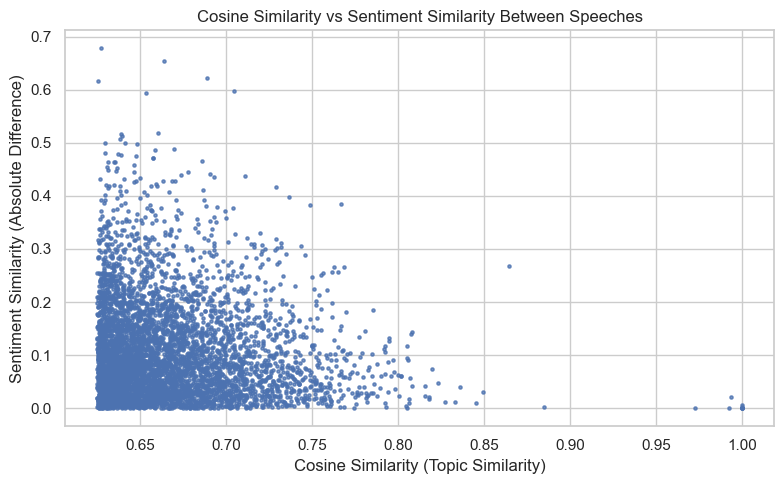

In [90]:
# Plot the relationship between cosine similarity and sentiment similarity

plt.figure(figsize=(8, 5))
plt.scatter(edge_weights.flatten(), sentiment_similarity_matrix.flatten(), alpha=0.5, s=5)
plt.xlabel('Cosine Similarity (Topic Similarity)')
plt.ylabel('Sentiment Similarity (Absolute Difference)')
plt.title('Cosine Similarity vs Sentiment Similarity Between Speeches')
plt.tight_layout()
plt.show()


In [51]:
#correlation between cosine similarity and sentiment similarity
correlation = np.corrcoef(edge_weights.flatten(), sentiment_similarity_matrix.flatten())[0,1]
print(f'Correlation between cosine similarity and sentiment similarity: {correlation:.2f}')

Correlation between cosine similarity and sentiment similarity: -0.11


Both from the scatterplot and the correlation coefficient, there does not seem to exist any clear association between thematic similarity (measured by cosine similarity of the speeches) and sentiment similarity (measured by the absolute difference in sentiment scores) for the connected speeches. The absence of correlation indicates that even speeches with similar topics can have varying emotional tones. This might reflect different perspectives, audiences or contexts that the speakers use to address similar subjects.

### Sentiment Analysis By Political Party

In [52]:
# aggregate sentiments for each party
party_sentiments = {party: [] for party in party_colors}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    sentiment = data.get('sentiment')
    if party in party_colors:
        party_sentiments[party].append(sentiment)

# calculate average sentiment for each party
avg_party_sentiments = {party: np.mean(sentiment) for party, sentiment in party_sentiments.items()}


We opted to calculate the happiest and saddest parties based on the average sentiment of individual speeches rather than combining all speeches from each party. This approach prevents potential skewing of results by longer or more frequent speeches, ensuring that each speech contributes equally. By averaging sentiments, the analysis becomes more balanced and representative of each party’s overall sentiment, while still reflecting the diversity of perspectives within their speeches.
So even though TF-IDF helps to ensure that longer speeches do not carry more weight, calculating sentiment on individual speeches and then averaging them further enhances the fairness of the analysis. This way, each speech is treated independently, avoiding biases from speech length or frequency, and providing a more accurate view of each party’s sentiment.

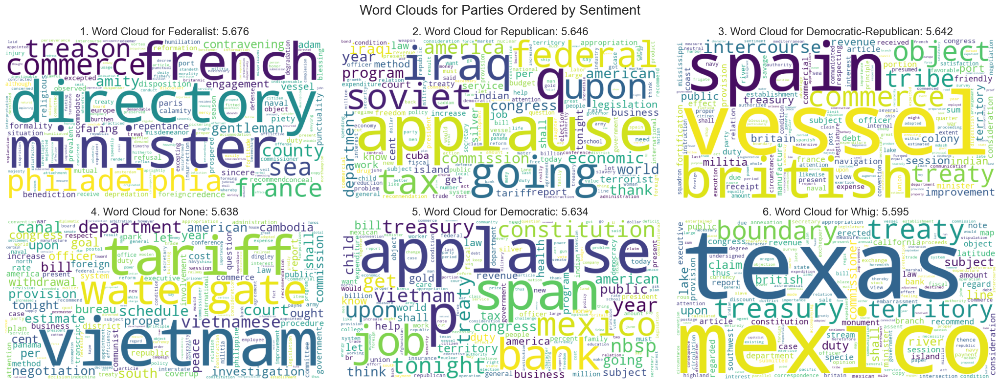

In [91]:
# order parties by average sentiment
avg_party_sentiments = {party: np.mean(sentiments) for party, sentiments in party_sentiments.items()}
sorted_parties = sorted(avg_party_sentiments, key=avg_party_sentiments.get, reverse=True)

# plot word clouds for the parties ordered by sentiment
fig, axs = plt.subplots(2, 3, figsize=(21, 8))
fig.suptitle('Word Clouds for Parties Ordered by Sentiment', fontsize=20)
for i, party in enumerate(sorted_parties):
    party_tfidf = {}
    for speech in parties_dict[party]:
        for word, score in tfidf_speech[speech].items():
            party_tfidf[word] = party_tfidf.get(word, 0.0) + score
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(party_tfidf)
    ax = plt.subplot(2, 3, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"{i+1}. Word Cloud for {party}: {avg_party_sentiments[party]:.3f}", fontsize=16)

plt.subplots_adjust(left=0.1, right=0.9, top=0.7, bottom=0.1, hspace=0.3, wspace=0.4)
plt.tight_layout()
plt.show()

From our analysis, we can see the **Federalist Party** appears as the "happiest" with the highest average sentiment score, while the **Whig Party** ranks as the "saddest". Federalists seem to frequently emphasize terms like *commerce*, *minister* and *treaty* reflecting their focus on international relations and trade. On the other hand Whigs often mention *mexico*, *treaty* and *boundary*, focusing on territorial expansion and foreign policy. However, the average sentiment scores across all parties show only a slight variation.

Parties like the Democratic-Republican Party show a strong focus on diplomacy and governance, with terms like *commerce* and *militia*. The Democratic Party emphasizes financial and constitutional topics with words like *bank*, *treasury* and *constitution*. In contrast, Republican speeches are characterized by terms such as *iraq*, *economic* and *tax* suggesting a focus on economic policies and national identity, with an undertone of patriotism supported by words like *america* and *federal*.

We can also visualize historical shifts, with terms like *vietnam* and *watergate* dominating speeches without formal party affiliations.

### Sentiment Analysis By Louvain Community

In [74]:
# aggregate sentiment scores for each community
community_sentiments = {community: [] for community in louvain_colors}
for node, data in SpeechNet.nodes(data=True):
    community = data.get('louvain_community')
    sentiment = data.get('sentiment')
    if community in louvain_colors:
        community_sentiments[community].append(sentiment)

largest_communities = sorted(community_sentiments, key=lambda x: len(community_sentiments[x]), reverse=True)[:6]
# calculate average sentiment for each community
avg_community_sentiments = {community: np.mean(sentiment) for community, sentiment in community_sentiments.items()}

# average sentiment of 6 largest communities
print("Average sentiment of 6 largest communities:")
for community in largest_communities:
    print(f"Community {community}: {avg_community_sentiments[community]:.3f}")


Average sentiment of 6 largest communities:
Community 12: 5.713
Community 0: 5.632
Community 18: 5.543
Community 20: 5.712
Community 15: 5.562
Community 3: 5.620


The average sentiment of the 6 largest communities ranges narrowly from 5.460 to 5.750, indicating a consistent tone across these groups.

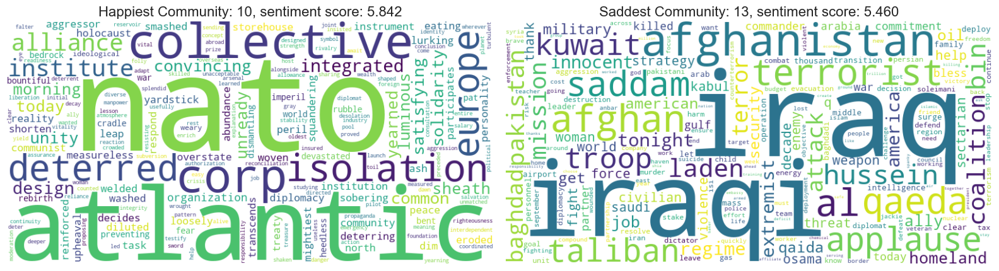

In [92]:
# get happiest and saddest communities on average based on community sentiments dictionary
happiest_community = max(avg_community_sentiments, key=avg_community_sentiments.get)
saddest_community = min(avg_community_sentiments, key=avg_community_sentiments.get)

# combine TF-IDF for the happiest community
happiest_community_tfidf = {}
for speech in louvain_dict[happiest_community]:
    for word, score in tfidf_speech[speech].items():
        happiest_community_tfidf[word] = happiest_community_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest community
saddest_community_tfidf = {}
for speech in louvain_dict[saddest_community]:
    for word, score in tfidf_speech[speech].items():
        saddest_community_tfidf[word] = saddest_community_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_community_tfidf)
saddest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_community_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Community: {happiest_community}, sentiment score: {avg_community_sentiments[happiest_community]:.3f}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Community: {saddest_community}, sentiment score: {avg_community_sentiments[saddest_community]:.3f}", fontsize=16)
plt.tight_layout()
plt.show()


From the wordclouds above, we can see distinct thematic differences between the happiest and saddest communities. 

The **happiest community** has a clear focus on collective defense and international cooperation, with terms like *atlantic*, *nato*, *corp*, *collective* and *alliance*. These words suggest a community that emphasizes unity, security and international relationships. The high sentiment scores could indicate a positive outlook on international collaborations, defense and alliances. 

In contrast, the **saddest community** revolves around military conflict and war, especially in the Middle East, being dominated by highly negative and charged terms such as *iraq*, *afghanistan*, *terrorist*, *qaeda*, *saddam* and *taliban*. The negativity of these terms suggests a community focused on war, terrorism and military operations, with a clear emphasis on the Iraq and Afghanistan conflicts. These communities are marked by a darker tone, which is reflected in their low sentiment scores. 

### Sentiment vs. Economy

In order to analyse how economic conditions may influence the tone, sentiment or topics of speeches, we decided to incorporate GDP data into the network by mapping each speech to the real GDP per capita of the corresponding year. This data was obtained from [MeasuringWorth.com](https://www.measuringworth.com/datasets/), which offers a wide range of economic datasets, including historical data from various periods in U.S. history. By exploring correlations between GDP and speech sentiment, we aim to uncover potential relationships between the national economic situation and political speeches.

In [76]:
# add gdps to the speeches
gdp_data = pd.read_csv('data/USGDP_1790-2024.csv', skiprows=2)
gdp_data.columns.values[1] = 'Real GDP per capita (dollars)'
gdp_data['Real GDP per capita (dollars)'] = gdp_data['Real GDP per capita (dollars)'].str.replace(',', '').astype(float)

# map years to GDP values
year_to_gdp = dict(zip(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)']))
# map nodes to their GDP values
node_to_gdp = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    node_to_gdp[node] = year_to_gdp.get(year, None)
# set the GDP attribute for the nodes
nx.set_node_attributes(SpeechNet, node_to_gdp, 'gdp')

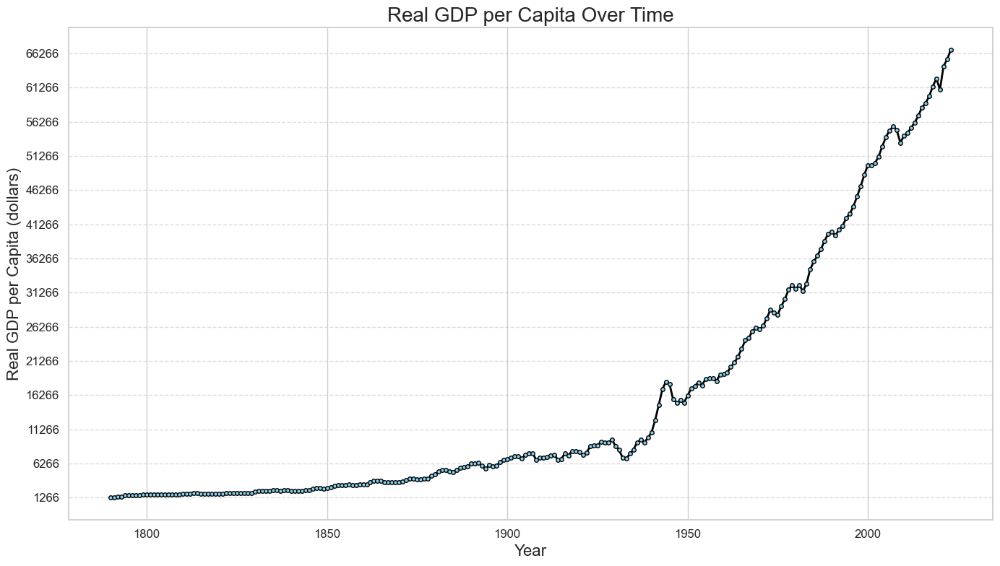

In [93]:
# plot the GDP over time
years = gdp_data['Year']
gdps = gdp_data['Real GDP per capita (dollars)']
plt.figure(figsize=(14, 8))
plt.plot(years, gdps, color='black', marker='o', linestyle='-', linewidth=2, markersize=4, markerfacecolor='skyblue', markeredgecolor='black')
plt.title('Real GDP per Capita Over Time', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Real GDP per Capita (dollars)', fontsize=16)
plt.xticks(fontsize=12)
y_ticks = range(int(min(gdps)), int(max(gdps)) + 1, 5000)
plt.yticks(y_ticks, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Plotting the real GDP per capita, a general upward trend becomes clear, reflecting long-term economic growth. 
From 1790 until around 1880 the GDP per capita shows a slower but steady growth. Afer this period there are more fluctuations in the annual values, reflecting a faster pace of economic growth. These variations correspond to historical economic events. For example, there are some decreases during recessions, such as the Great Depression in the 1930s, the financial crisis of 2008 and the covid pandemic in 2020. Additionally, we can observe periods of rapid economic growth, particularly during the WWII boom from 1939 to 1945 and the economic surge in the late 1990s. 

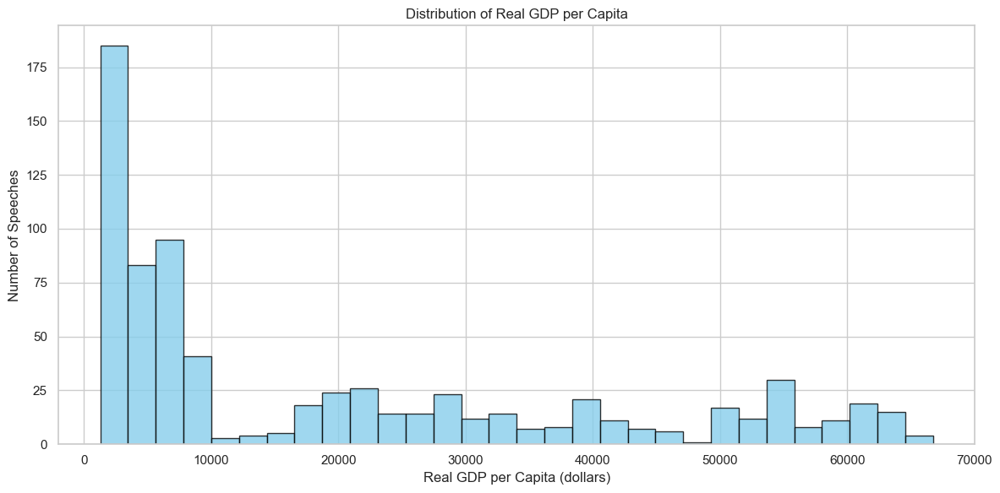

In [94]:
# bar plot of gdps distribution over speeches
plt.figure(figsize=(12, 6))
gdps = [data['gdp'] for _, data in SpeechNet.nodes(data=True) if data['gdp'] is not None]
hist, bin_edges = np.histogram(gdps, bins=30)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)    
plt.title('Distribution of Real GDP per Capita')
plt.xlabel('Real GDP per Capita (dollars)')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()

Analysing the distribution of speeches across the GDP per capita for the corresponding year, it seems that during periods of worse economic conditions, before 1940, presidential speeches were more frequent. This could possibly be due to it being the best way of addressing public concerns or gainning support during older times. In contrast, for GDP values above 10000, speeches are generally less frequent compared to the lower GDP range. However, while there is some variation across GDP ranges, the frequency of speeches remains relatively similar. It is likely that, in more recent times, speeches have become less frequent, possibly due to the rise of other forms of communication. Therefore, it seems that the relationship between GDP and the number of speeches is not particularly strong.

Let's aggregate the average sentiment of the speeches for each year and analyse its fluctuations.

In [79]:
# get the sentiment scores for each year
sentiment_years = defaultdict(list)
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    sentiment = data.get('sentiment')
    if sentiment is not None:
        sentiment_years[year].append(sentiment)

# calculate the average sentiment for each year
average_sentiment_years = {year: np.mean(sentiment) for year, sentiment in sentiment_years.items()}

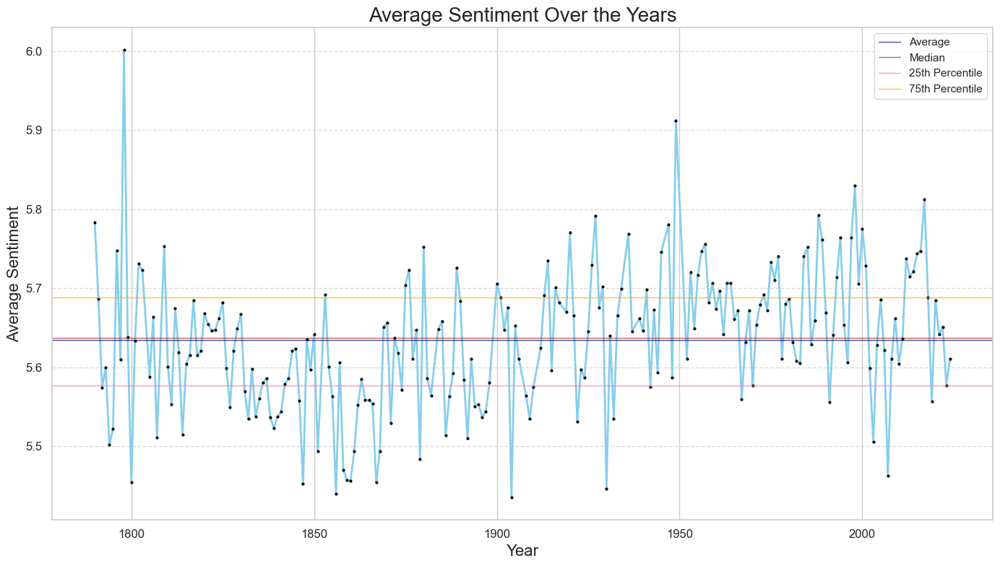

In [95]:
# calculate the median, mean, 25th and 75th percentiles of the average sentiment per year
median_sentiment_years = np.median(list(average_sentiment_years.values()))
percentile_25_years = np.percentile(list(average_sentiment_years.values()), 25)
percentile_75_years = np.percentile(list(average_sentiment_years.values()), 75)
average_average_sentiment_years = np.mean(list(average_sentiment_years.values()))

# plot the average sentiment over the years with mean, median and 25th and 75th percentiles
plt.figure(figsize=(14, 8))
plt.plot(list(average_sentiment_years.keys()), list(average_sentiment_years.values()), color='skyblue', marker='o', linestyle='-', linewidth=2, markersize=2, markerfacecolor='black', markeredgecolor='black')
plt.axhline(average_average_sentiment_years, color='navy', linestyle='-', linewidth=1, label='Average', alpha=0.7)
plt.axhline(median_sentiment_years, color='brown', linestyle='-', linewidth=1, label='Median', alpha=0.7)
plt.axhline(percentile_25_years, color='hotpink', linestyle='-', linewidth=1, label='25th Percentile', alpha=0.7)
plt.axhline(percentile_75_years, color='orange', linestyle='-', linewidth=1, label='75th Percentile', alpha=0.7)
plt.legend()
plt.title('Average Sentiment Over the Years', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Average Sentiment', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Analysing the sentiment scores over time, we can draw some conclusions on the emotions of the speeches. We can see that the sentiment scores are mostly stable over time, with some low points during the 1930s and 1940s, which correspond to the Great Depression and WWII. We can also see that after low points many times a peak follows, indicating that after periods of crisis, there is a tendency for sentiment to increase. This could be due to the optimism and hope that follows difficult times.

Analysing the most prominent words used during the happiest and saddest years, we can get insights into the themes of presidential speeches in response to the prevailing sentiment of the time.

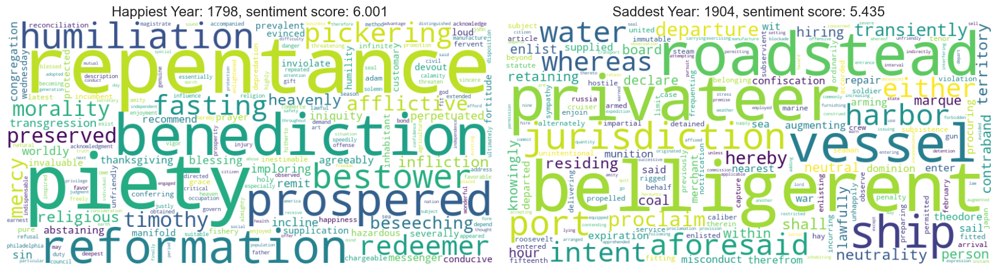

In [96]:
# get happiest and saddest years on average 
happiest_year = max(average_sentiment_years, key=average_sentiment_years.get)
saddest_year = min(average_sentiment_years, key=average_sentiment_years.get)

# combine TF-IDF for the happiest year
happiest_year_tfidf = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    if year == happiest_year:
        for word, score in tfidf_speech[node].items():
            happiest_year_tfidf[word] = happiest_year_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest community
saddest_year_tfidf = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    if year == saddest_year:
        for word, score in tfidf_speech[node].items():
            saddest_year_tfidf[word] = saddest_year_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_year_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_year_tfidf)
saddest_year_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_year_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_year_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Year: {happiest_year}, sentiment score: {average_sentiment_years[happiest_year]:.3f}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_year_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Year: {saddest_year}, sentiment score: {average_sentiment_years[saddest_year]:.3f}", fontsize=16)
plt.tight_layout()
plt.show()
 

The word clouds highlight the contrast between the words of the speeches in the happiest and the saddest years. The first word cloud contains many religious and moralistic words such as *repentance*, *benediction*, *piety* and *mercy*. This shows that the year's speeches had a strong focus on themes of spirituality and gratitude indicating that in 1798 religious and moral language was often used to instill hope and unity. On the other hand the second word cloud is dominated by words with war especially maritime-related words like *privateer*, *vessel*, *belligerent* or *harbor*. These words reflect a time of naval conflicts, likely influenced by the Russo-Japanese war (1904-1905). We can see that outside events such as wars and conflicts can negatively affect the tone of presidential speeches but positive words can also be used to relay optimism and stability during the unstable times of the formation of the U.S..

We plotted both the average yearly sentiment and the GDP per capita over the years to explore the potential correlation between the two. However, the results show that while GDP has steadily increased over time, the sentiment fluctuates significantly, suggesting no clear relationship between the two variables. This indicates that changes in GDP per capita do not necessarily correspond to shifts in the sentiment of presidential speeches, highlighting the complexity of the factors that influence the political discourse.

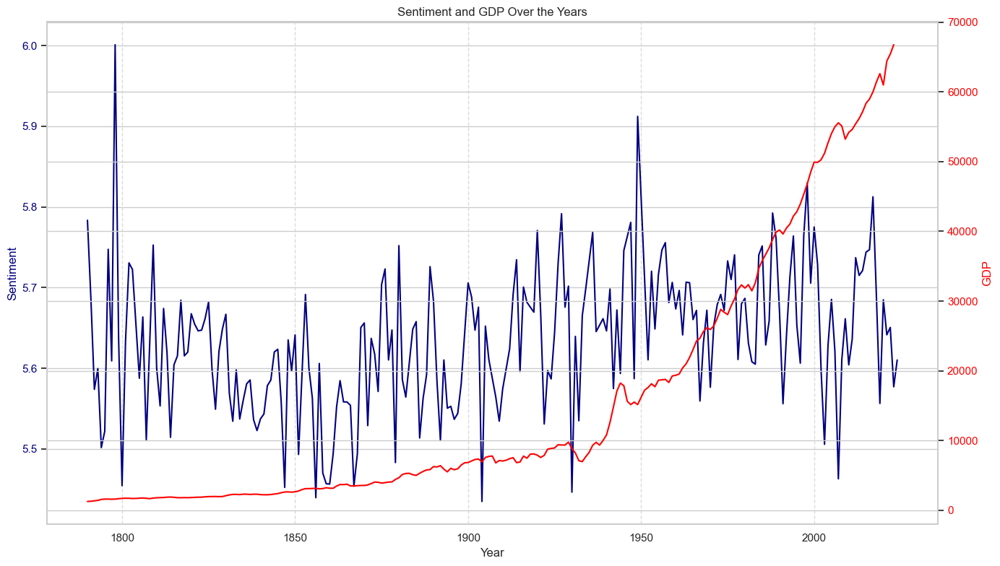

In [97]:
# combine plot of sentiment and GDP over the years
fig, ax1 = plt.subplots(figsize=(14, 8))

ax1.plot(list(average_sentiment_years.keys()), list(average_sentiment_years.values()), color='navy', label='Sentiment')
ax1.set_xlabel('Year')
ax1.set_ylabel('Sentiment', color='navy')
ax1.tick_params(axis='y', labelcolor='navy')
plt.grid(axis='x', linestyle='--', alpha=0.7)

ax2 = ax1.twinx()
ax2.plot(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)'] , color='red', label='GDP', linestyle='-')
ax2.set_ylabel('GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Sentiment and GDP Over the Years')
plt.tight_layout()
plt.show()


Despite our conclusions from the plot, we calculated the correlation coefficient between the average yearly sentiment and GDP per capita, both for the current year and with a one-year lag, to check if any delayed effect of GDP on sentiment might exist. 


In [98]:
# correlation between average yearly sentiment and GDP:
# filter out years that are not in gdp_data
gdp_data_forcorr = gdp_data[gdp_data['Year'].isin(average_sentiment_years.keys())]
# filter out years that do not have sentiment data
average_sentiment_years_forcorr = {year: sentiment for year, sentiment in average_sentiment_years.items() if year in gdp_data_forcorr['Year'].values}

# create a dataframe for the correlation
df = pd.DataFrame({'Sentiment': average_sentiment_years_forcorr.values(), 'GDP': gdp_data_forcorr['Real GDP per capita (dollars)']})
correlation = df['Sentiment'].corr(df['GDP'])
print(f"Correlation between sentiment and GDP: {correlation}")

Correlation between sentiment and GDP: 0.291564192308873


In [99]:
# calculate the correlation between sentiment and 1 year lagged GDP
lagged_gdp_values = gdp_data['Real GDP per capita (dollars)'][1:].values  # use gdp from the following year

# align the sentiment data with the GDP data
for year in gdp_data['Year']:
    if year not in average_sentiment_years.keys():
        average_sentiment_years[year] = None

sentiment_values_lagged = list(average_sentiment_years.values())
sentiment_values_lagged = [sentiment for year, sentiment in sorted(zip(average_sentiment_years.keys(), sentiment_values_lagged))][:-1][:-1]
# calculate the correlation 
lagged_df = pd.DataFrame({'Sentiment': sentiment_values_lagged, 'GDP': lagged_gdp_values})
correlation_lagged_pandas = lagged_df['GDP'].corr(lagged_df['Sentiment'])
print(f"Correlation with lagged GDP: {correlation_lagged_pandas}")

Correlation with lagged GDP: 0.3078388980389013


Both correlation coefficients are considerably small, which evidences a weak relationship between GDP per capita and average yearly sentiment. This supports our earlier findings, reinforcing that there is no significant correlation between the two variables over time.

#### Sentiment vs. GDP Growth

Since we found no significant relationship between yearly GDP and sentiment, we decided to investigate the potential connection between GDP growth per presidential term and sentiment. This approach was chosen because economic performance over the course of a term might influence presidential rhetoric and decision-making, and analyzing term-based data could reveal a more meaningful relationship between economic conditions and the sentiment expressed in speeches. The emotional tone of speeches could be related to the challenges or successes experienced by the president~, as well as the presidents typical emotional tone.

In [100]:
# get presidential terms
terms_df = pd.read_csv('data/presidential_terms.csv', sep=',')

# get list of gdps for each term and add as column to terms_df
term_gdps = []
for i, row in terms_df.iterrows():
    start_year = row['Start Year']
    end_year = row['End Year']
    president = row['President']
    # get GDPs for the term but exclude 2024 and after
    term_gdp = gdp_data[(gdp_data['Year'] >= start_year) & (gdp_data['Year'] <= end_year) & (gdp_data['Year'] <= 2024)]
    term_gdps.append(term_gdp['Real GDP per capita (dollars)'].tolist())
terms_df['GDPs'] = term_gdps

We checked for one-year presidential terms to see if they represent important dates or events in U.S. history.

In [101]:
# print terms that were only one year long and its year
one_year_terms = terms_df[terms_df['Start Year'] == terms_df['End Year']]

print('One year terms:')
print(one_year_terms[['Term', 'Start Year', 'End Year']])

One year terms:
               Term  Start Year  End Year
13      W. Harrison        1841      1841
21       Lincoln II        1865      1865
26         Garfield        1881      1881
32      McKinley II        1901      1901
45  F. Roosevelt IV        1945      1945


These short terms are indeed important for our analysis considering they represent times where a president's term was cut short due to unforeseen events, such as death or assassination. Therefore, to avoid skewing the GDP growth calculation, we decided to set the GDP growth for these terms to 0, so we ensure a more nuanced analysis

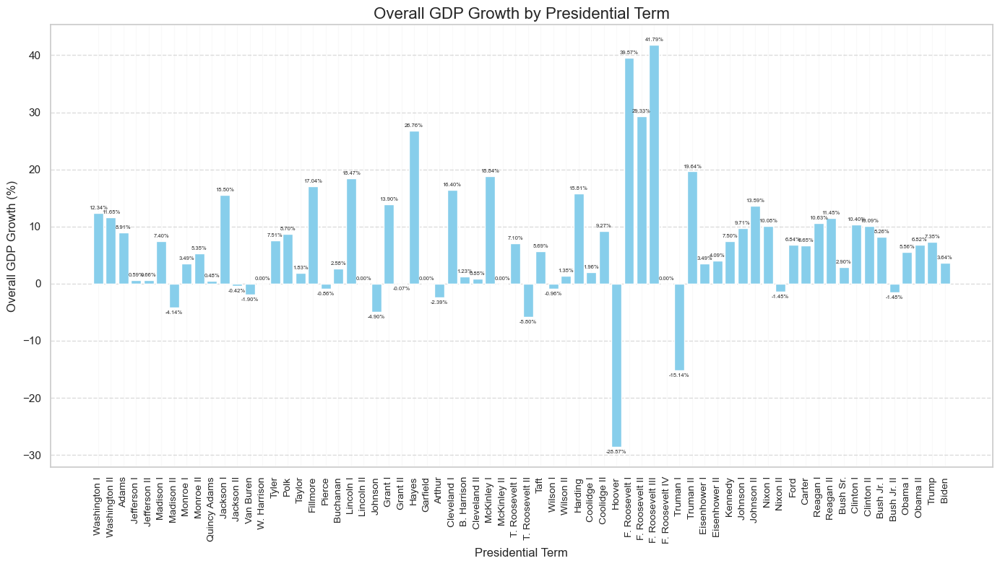

In [102]:
# calculate GDP growth for each term
terms_df['GDP_growth'] = terms_df['GDPs'].apply(lambda gdp_list: (gdp_list[-1] - gdp_list[0]) / gdp_list[0] * 100 if len(gdp_list) > 1 else 0)

# plot overall GDP growth by presidential term
plt.figure(figsize=(14, 8))
bars = plt.bar(terms_df['Term'], terms_df['GDP_growth'], color='skyblue')
plt.xticks(rotation=90, fontsize=10)
plt.title('Overall GDP Growth by Presidential Term', fontsize=16)
plt.xlabel('Presidential Term', fontsize=12)
plt.ylabel('Overall GDP Growth (%)', fontsize=12)
for bar in bars:
    height = bar.get_height() 
    # if the bar is positive, place text above, else place it below
    if height >= 0:
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5,  # place text above positive bars
                 f'{height:.2f}%', ha='center', va='bottom', fontsize=5.5)
    else:
        plt.text(bar.get_x() + bar.get_width() / 2, height - 0.5,  # place text below negative bars
                 f'{height:.2f}%', ha='center', va='top', fontsize=5.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()



The bar plot of GDP growth over presidential terms clearly shows fluctuations, with some periods experiencing negative growth percentages. However, in more recent terms the values appear less variable, indicating more stable economic growth compared to earlier periods. This suggests that while the economy faced more significant ups and downs in the past, recent terms have seen a relatively smoother economic trajectory.

In [103]:
# get the sentiment scores for each presiential term
sentiment_terms = defaultdict(list)
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    sentiment = data.get('sentiment')
    president = data['president']
    for _, row in terms_df.iterrows():
        if president == row['President'] and row['Start Year'] <= year <= row['End Year']:
            sentiment_terms[row['Term']].append(sentiment)
# calculate the average sentiment for each year
average_sentiment_terms = {term: np.mean(sentiment) for term, sentiment in sentiment_terms.items()}

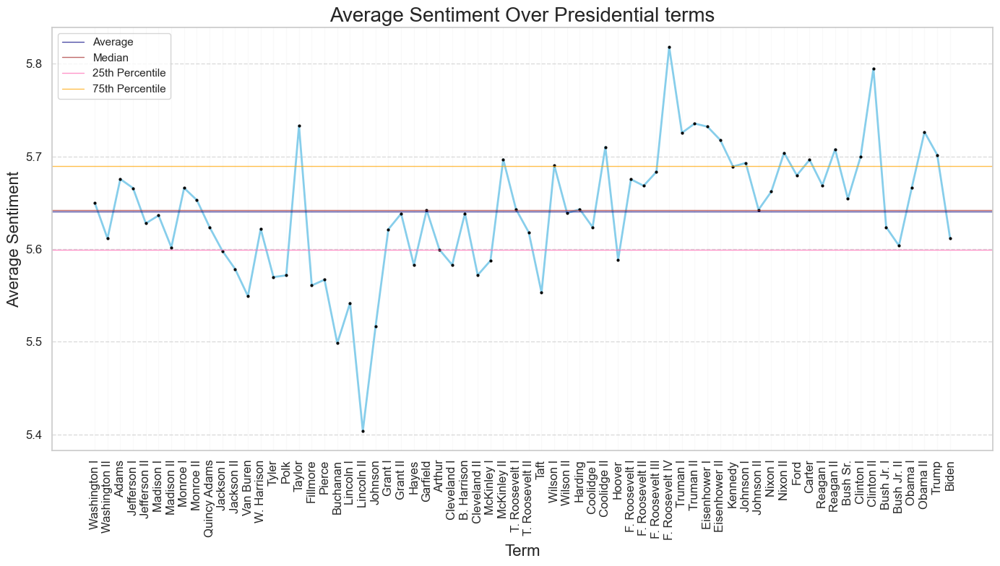

In [104]:
# calculate the median, mean, 25th and 75th percentiles of the average sentiment per year
median_sentiment_terms = np.median(list(average_sentiment_terms.values()))
percentile_25_terms = np.percentile(list(average_sentiment_terms.values()), 25)
percentile_75_terms = np.percentile(list(average_sentiment_terms.values()), 75)
average_average_sentiment_terms = np.mean(list(average_sentiment_terms.values()))

# plot the average sentiment over the years with mean, median and 25th and 75th percentiles
plt.figure(figsize=(14, 8))
plt.plot(list(average_sentiment_terms.keys()), list(average_sentiment_terms.values()), color='skyblue', marker='o', linestyle='-', linewidth=2, markersize=2, markerfacecolor='black', markeredgecolor='black')
plt.axhline(average_average_sentiment_terms, color='navy', linestyle='-', linewidth=1, label='Average', alpha=0.7)
plt.axhline(median_sentiment_terms, color='brown', linestyle='-', linewidth=1, label='Median', alpha=0.7)
plt.axhline(percentile_25_terms, color='hotpink', linestyle='-', linewidth=1, label='25th Percentile', alpha=0.7)
plt.axhline(percentile_75_terms, color='orange', linestyle='-', linewidth=1, label='75th Percentile', alpha=0.7)
plt.legend()
plt.title('Average Sentiment Over Presidential terms', fontsize=20)
plt.xlabel('Term', fontsize=16)
plt.ylabel('Average Sentiment', fontsize=16)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()

The sentiment values show considerable variation across presidential terms. From the time of John Quincy Adams to William Taft, there is a period with notably lower sentiment, often falling well below the average. This period coincides with several challenging economic conditions, such as the Panic of 1837 and the Civil War, which may have influenced the emotional tone of presidential speeches. In more recent terms, sentiment generally trends above the average, with exceptions during the presidencies of George W. Bush (both I and II) and Joe Biden, where sentiment decreases to below average values, which correspond to times of significant economic challenges, such as the Great Recession and the COVID-19 pandemic. Before John Quincy Adams, sentiment fluctuated both above and below the average, without showing a clear directional trend.

From a quick analysis of the two plots, despite some key events potentially associated with more abrupt shifts in sentiment, the GDP growth percentage per term does not appear to be directly aligned with the sentiment of the speeches. This suggests that while key events may strongly influence the emotional tone of presidential speeches, in general, sentiment is driven by a more complex set of factors beyond just the economic state.

In [107]:
# correlation between sentiment per term and GDP growth per term
terms_df['Sentiment'] = list(average_sentiment_terms.values())
correlation_terms = terms_df['Sentiment'].corr(terms_df['GDP_growth'])
print(f'Correlation between sentiment per term and GDP growth per term: {correlation_terms:.2f}')

Correlation between sentiment per term and GDP growth per term: 0.11


The correlation coefficient between sentiment and GDP growth further underscores the weak relationship between the two, reinforcing the idea that the sentiment expressed in presidential speeches is not strongly driven by the economic state of the U.S. 

## Topic Analysis

In this section, we explore the presence and evolution of various topics within presidential speeches. Our approach consisted of counting the frequency of predefined topics based on keywords related to areas such as the economy, politics, war and social issues. By analyzing the frequency of these topics across different speeches, we want to gain insights into the primary concerns reflected in presidential speeches over time.

To create the keyword groups for each topic we used ChatGPT, which generated a set of keywords for important political speech topics in a JSON format. 

In [108]:
# read and extract topics from .json file
with open('data/topics.json', 'r') as f:
    topics = json.load(f)

ChatGPT's topic descriptions:

1. **Economy**: Discusses the state of a country's financial system, including growth, inflation, unemployment, and fiscal policies.
   
2. **Politics**: Covers the actions, ideologies, and policies of political leaders and parties, as well as the impact of governance on society.

3. **War and Peace**: Focuses on conflicts, military actions, peace treaties, and diplomatic efforts to prevent or resolve wars.

4. **Social Issues**: Addresses societal challenges like inequality, poverty, human rights, and social justice that require government attention.

5. **Environment**: Relates to discussions on climate change, sustainability, pollution, and the government's role in protecting the planet.

6. **Terrorism**: Examines issues related to terrorist threats, counterterrorism measures, and the impact of terrorism on national and global security.

7. **People and Society**: Explores cultural norms, human rights, social values, and the role of individuals and communities in shaping society.

8. **Violence**: Focuses on physical harm and aggression, including criminal violence, domestic violence, and the societal impact of violent behavior.

In [109]:
# calculate the number of occurrences of each topic in speech
topic_counts = {topic: Counter() for topic in topics}

for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    text = data['transcript']
    text = process_text(text)
    for topic, keywords in topics.items():
        topic_counts[topic][node] += sum(text.count(word) for word in keywords)


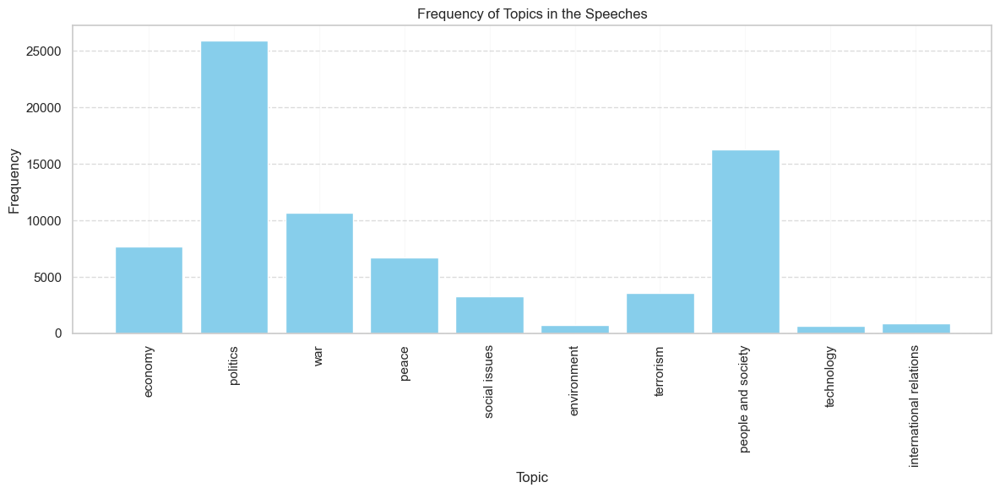

In [110]:
# plot frequency of each topic in the speeches during all years
topic_frequencies = {topic: sum(count.values()) for topic, count in topic_counts.items()}
plt.figure(figsize=(12, 6))
plt.bar(range(len(topic_frequencies)), topic_frequencies.values(), color='skyblue')
plt.xticks(range(len(topic_frequencies)), topic_frequencies.keys(), rotation=90)
plt.xlabel('Topic')
plt.ylabel('Frequency')
plt.title('Frequency of Topics in the Speeches')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()

From the overall distribution of the topics per speeches we can see that politics is often prioritized, followed by people and society, which reflects the significant focus on governance and societal issues.  On the other hand,environment and technology are the least frequent topics, indicating that these areas may not have been as prominent in presidential speeches historically
War, economy and peace also appear quite frequently in the presindetial speeches, highlighting their importance.


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #808080; border-radius:4px; max-width: 96%; overflow: hidden;">

**Exploration of Topics with LDA:**

We attempted to use Latent Dirichlet Allocation (LDA) to discover underlying topics in the speech transcripts. However, the results did not produce coherent or meaningful topics. The top words for each topic did not form recognizable themes, and the discovered topics did not align with our predefined topic categories or expectations. Due to these issues, we decided to discard LDA from further analysis as it did not provide valuable insights for our research.

</div>

We will now examine how the frequency of each topic evolves over time. By plotting the frequency of each topic per year, we can observe trends and shifts in the focus of presidential discourse. To ensure comparability across different time periods and account for variations in the number of speeches per year, we normalize the frequency of each topic by dividing the count of mentions of each topic by the total number of speeches in that year. 

In [111]:
# frequency of each topic per year 
topic_counts_year = pd.DataFrame(topic_counts)
topic_counts_year['Year'] = [SpeechNet.nodes[node]['date'].year for node in topic_counts_year.index]
topic_counts_year = topic_counts_year.groupby('Year').sum()

# normalize the topic counts
topic_counts_year_norm = topic_counts_year.div(topic_counts_year.sum(axis=1), axis=0)

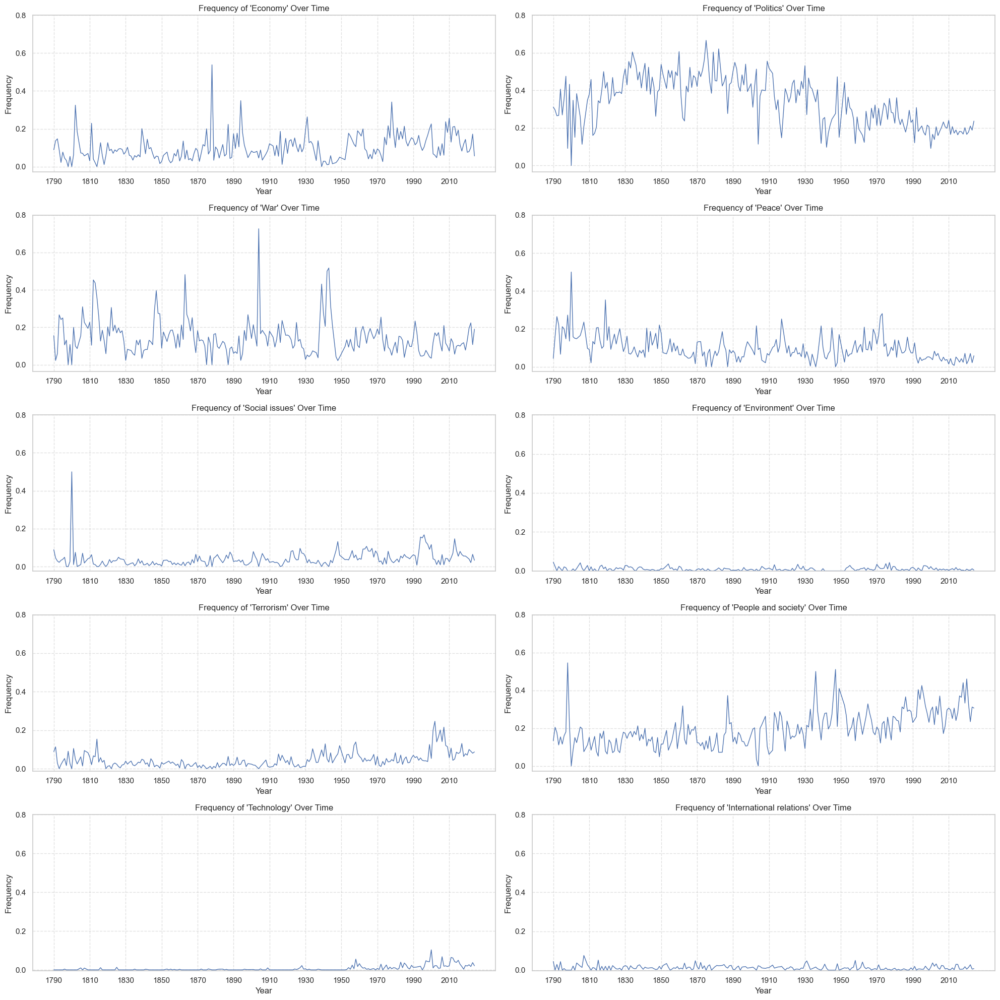

In [112]:
# plot the frequency of each topic over time 
sns.set(style="whitegrid")
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
for i, topic in enumerate(topics):
    ax = plt.subplot(5, 2, i + 1)
    years = topic_counts_year_norm.index
    frequencies = topic_counts_year_norm[topic]
    plt.plot(years, frequencies, label=topic, linestyle='-', linewidth=1)
    plt.title(f"Frequency of '{topic.capitalize()}' Over Time")
    plt.xlabel("Year")
    plt.ylabel("Frequency")
    plt.xticks(np.arange(min(years), max(years) + 1, 20))
    plt.yticks(np.arange(0, 0.9, 0.2))
    plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


The plots show the frequency of specific topics discussed in U.S. presidential speeches over time, highlighting how topics align with major historical events.

**Economy** related topics frequently appear throughout the speeches for all years. However, we can see some significant peaks that can correlate to important financial events. For instance, the peak in 1878 coincides with the post-Civil War economic recovery and the efforts to stabilize the economy following the Panic of 1873. Another major peak in the 1890s aligns with the economic challenges faced during the Depression of 1893. The sharp increase around the 1930s falls during the Great Depression, as President Franklin D. Roosevelt introduced the New Deal to address unemployment and stimulate recovery, while the one around 1979 can be linked to inflation and the energy crisis that cause disturbance during President Jimmy Carter’s administration. Lastly, the 2008 peak corresponds to the Great Recession, highlighting efforts to stabilize markets and prevent further economic collapse. Economic discussions in presidential speeches often show a reactive focus, prioritizing financial stability during crises and recovery periods.

Similar to economics, **political** topics also dominate the speech dataset, showing a general slightly upwards trend in normalized frequency from the 1790s until around 1875. After that, it starts to decrease and seems to stabilize around 1990, continuing at a more consistent level. The 1790s shows a spike that can be tied to foundational discussions, including the Bill of Rights and early federal structures. Political discourse peaks again in 1860, during the the election of Abraham Lincoln and the Civil War era (1861-1865), reflecting the polarizing political climate surrounding slavery and secession. The high increase also observed around 1875, can be attributed to political discussions surrounding the end of Reconstruction and the changes that followed the Civil War. Smaller surges in the late 20th century align with moments such as Watergate in the 1970s and the Monica Lewinsky scandal in the 1990s.

**War-related** topics rise during major conflicts, such as the War of 1812, reflected in the peak during the 1810s, and the Civil War, as seen by the peak around 1860s. The highest peak is seen in the early 1900s, which could be reflecting military discussions related to the aftermath of the Spanish-American War (1898), including U.S. expansion in the Caribbean and the Pacific, as well as the construction of the Panama Canal. A major surge is observed from 1938 to 1942, during the lead-up to and early years of World War II (1941-1945), while smaller increases are also noted during the Vietnam War in the 1960s and 1970s.

**Peace** topics often follow war-related peaks, particularly during recovery periods like the post-World War II Marshall Plan. This dual trend underscores how presidential speeches reflect both the mobilization efforts during conflict and the diplomacy required in its aftermath. Unlike the sharp peaks seen in war-related discussions, peace-related peaks are less pronounced, reflecting a more gradual emphasis on reconciliation over time.

**Social issues** become more dominant during periods of civil unrest.  The highest peak is observed around 1800, potentially reflecting early debates about the institution of slavery and societal organization in the nascent United States. Afterward, the frequency remains somewhat stable but less pronounced, with slight increases during key periods. High normalized frequencies are seen between 1895 and 1910, coinciding with the Progressive Era and movements advocating for social reforms like labor rights and women’s suffrage. We can see another peak in the 1960s, corresponding to the Civil Rights Movement and Martin Luther King Jr.'s assassination. More recent surges in 2013 and the 2020s correspond to movements like Black Lives Matter, highlighting ongoing struggles for equality and civil rights.

**Terrorism-related** topics show a slight upward trend starting from the 1930s, reflecting growing concerns about global conflicts and security threats. A considerable increase and more pronounced peaks occur from 2001 onward, dominating the discourse following the September 11 attacks. The War on Terror, initiated in response, continues to shape rhetoric in the early 21st centuryThese discussions reflect a heightened focus on national security and global stability in the post-9/11 era.

**Technology-related** discussions gain prominence in the late 20th century and early 21st century, reflecting rising technological advancements. Initial growth in the 1960s aligns with the Space Race and Apollo program, as technological innovation became a symbol of national progress. The more recent peaks reflect the digital revolution, cybersecurity concerns and the role of technology in modern governance.

**Environmental** topics remain minimal and relatively constant throughout history. A notable peak occurs in the 1970s, coinciding with the establishment of the Environmental Protection Agency in 1970 and the rise of environmental awareness during that era. Subsequent discussions align with global climate policies, such as the Kyoto Protocol (1997), reflecting a growing focus on environmental challenges.

Discussions about **people and society**show an overall rising trend, marked by sharp edges in periods of societal change or crisis. Peaks in the 1800s and 1860s reflect the nation's early struggles with societal structures and the Civil War. The 1930s to 1950s highlight efforts to address unemployment during the Great Depression and post-war recovery.  Recent increases in the 2020s correspond to movements for social justice and equity. These trends demonstrate how presidential rhetoric responds to public needs and social advocacy.

Speeches related to **international relations** are relatively constant, with minor fluctuations. This reflects the steady role of U.S. foreign policy in presidential speeches, where peaks align with increases in other topics such as war, peace and economy, but the focus on diplomacy and international engagement remains stable over time.


### Topic Analysis By Political Party

By examining the frequency of topics for each party, we can uncover patterns in the topics that are emphasized by different political parties throughout presidential history.

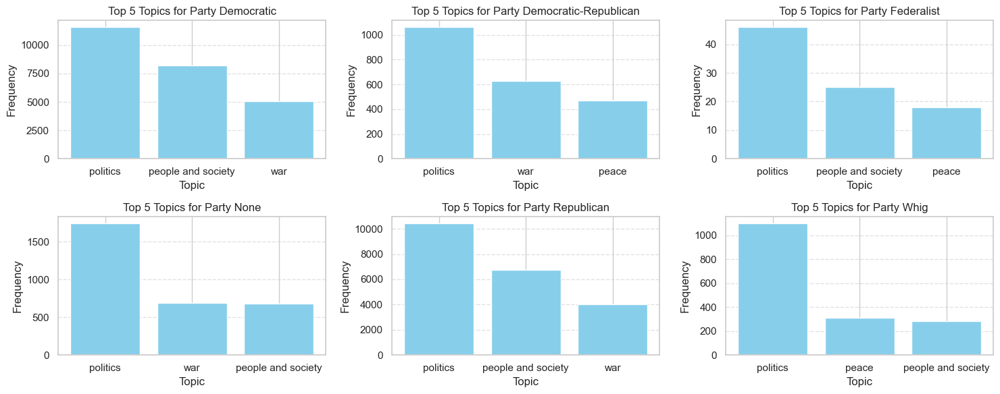

In [314]:
# party topic counts
topic_counts_party = pd.DataFrame(topic_counts)
topic_counts_party['party'] = [SpeechNet.nodes[node]['party'] for node in topic_counts_party.index]
topic_counts_party = topic_counts_party.groupby('party').sum()
        
# Get top 3 topics for each party
top3_topics_party = {}
for party in topic_counts_party.index:
    top3_topics_party[party] = topic_counts_party.loc[party].nlargest(3).index

# plot the top 3 topics for each party
fig, axs = plt.subplots(2, 3, figsize=(15, 6))
for i, party in enumerate(top3_topics_party):
    ax = plt.subplot(2, 3, i + 1)
    topics = top3_topics_party[party]
    frequencies = topic_counts_party.loc[party, topics]
    plt.bar(topics, frequencies, color='skyblue')
    plt.title(f"Top 5 Topics for Party {party}")
    plt.xlabel("Topic")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


The figure above shows that the most frequent topics and their distribution are generally the same accross the main parties. Them being politics, people and society and war, with all parties prioritizing political discussions in their speeches. This suggests that the main topics of presidential speeches are consistent across parties, reflecting the common themes and concerns that presidents address regardless of their political affiliation. The differences lie in the priority each party assigns to these topics, reflecting varying emphases on specific issues depending on the party's stance.

### Topic Analysis By Louvain Community

By analyzing the top topics within the six largest communities, we can uncover the primary concerns and themes that are emphasized within these groups, offering insights into the varying perspectives across communities.

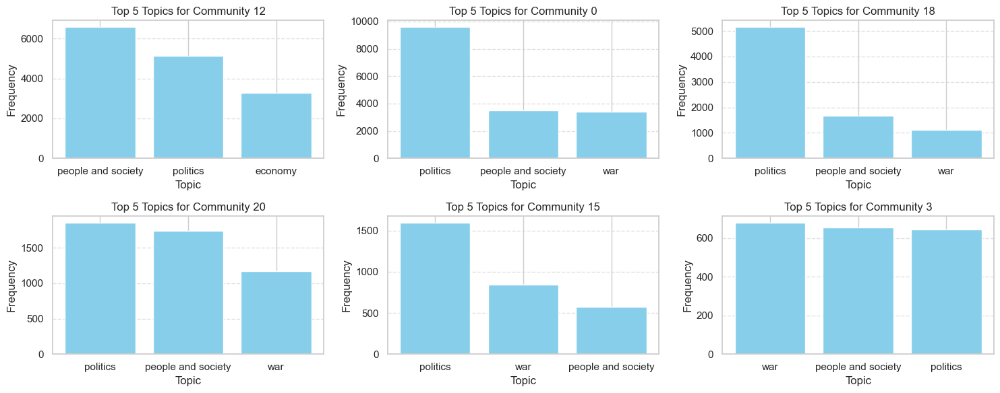

In [315]:
# community topic counts
topic_counts_community = pd.DataFrame(topic_counts)
topic_counts_community['community'] = [SpeechNet.nodes[node]['louvain_community'] for node in topic_counts_community.index]
topic_counts_community = topic_counts_community.groupby('community').sum()
        
# Get top 3 topics for each community of the 6 largest communities
top3_topics_community = {}
for community in largest_communities:
    top3_topics_community[community] = topic_counts_community.loc[community].nlargest(3).index

# plot the top 3 topics for each community
fig, axs = plt.subplots(2, 3, figsize=(15, 6))
for i, community in enumerate(top3_topics_community):
    ax = plt.subplot(2, 3, i + 1)
    topics = top3_topics_community[community]
    frequencies = topic_counts_community.loc[community, topics]
    plt.bar(topics, frequencies, color='skyblue')
    plt.title(f"Top 5 Topics for Community {community}")
    plt.xlabel("Topic")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In this figure we can see the same topics as in the previous one, but now there is a slight difference in the distribution of the topics. This suggests that the communities formed by the Louvain algorithm have distinct thematic focuses, with some topics being more prominent in certain communities compared to others. This shows that the communities are not separated by single topics, but rather have a mix of themes that are more or less emphasized in each group.

Identifying the top three topics for the happiest and saddest communities we can conclude which key themes characterize these emotional extremes.

In [316]:
# topic for happiest and saddest communities
happiest_community_topics = topic_counts_community.loc[happiest_community].nlargest(3).index
saddest_community_topics = topic_counts_community.loc[saddest_community].nlargest(3).index

# print the top 3 topics for the happiest and saddest communities
print(f"Top 3 topics for happiest community {happiest_community}:")
print(list(happiest_community_topics))
print(f"Top 3 topics for saddest community {saddest_community}:")
print(list(saddest_community_topics))


Top 3 topics for happiest community 10:
['peace', 'war', 'people and society']
Top 3 topics for saddest community 13:
['war', 'people and society', 'terrorism']


The **happiest community** emphasizes peace, war and people and society, suggesting a focus on collective defense, international cooperation, and societal well-being. As identified earlier in its wordcloud, it reflects a positive outlook on unity, security and international relationships, aligning with high sentiment scores.

In contrast, the **saddest community** is centered around war, people and society and terrorism, highlighting military conflict, particularly in the Middle East, as we concluded in our wordcloud analysis. The community's focus on negative terms related to war and terrorism reflects the darker tone and lower sentiment scores associated with it.

## Conclusion

This study analyses US presidential speeches to discover patterns, sentiment and topics over time. Using network analysis and natural language processing (NLP), we found that speech similarities align more with historical and topical contexts than with political affiliations. Sentiment trends reflect economic conditions and historical events, with a generally positive tone influenced by prosperity and crises. Analysing topics over the years, themes such as politics and war, were the most popular ones, while more recent, issues like environment, have gained importance. Overall, the results highlight how presidential speeches adapt to and reflect socio-political and economic challenges throughout history.